In [1]:
import numpy as np
import scipy as sp

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from dataclasses import dataclass
import math
import cmath

import pandas as pd
import datetime
import time

from numba import jit, njit
from numba import cuda
from numba.cuda.random import create_xoroshiro128p_states, xoroshiro128p_normal_float64, xoroshiro128p_uniform_float64
import numba
import gc


import json
import requests
import copy


import sklearn as sk
from sklearn import metrics
import torch

from torch import nn
from torch.utils.data import DataLoader, Dataset, TensorDataset
from sklearn.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=FutureWarning) 
from numba.core.errors import NumbaPerformanceWarning
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning) 

In [2]:
import pandas as pd
import datetime
import time
from tqdm import tqdm

import numpy as np
import matplotlib.pyplot as plt


import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

from sklearn.model_selection import train_test_split

In [3]:
import os

import jax
import jax.numpy as jnp
from jax import jit, vmap
from functools import partial

os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['XLA_PYTHON_CLIENT_ALLOCATOR'] = 'platform'

In [9]:
def get_cir_paths(params, T, N_paths, N_steps, key):
    dt = T/(N_steps-1)
    kappa, mean, gamma, rho, v0 = params
    
    key1, key2 = jax.random.split(key)
    z1 = jax.random.normal(key1, (N_paths, N_steps - 1))
    z2 = jax.random.uniform(key2, (N_paths, N_steps - 1))

    def step(v, z):
        z1_t, z2_t = z
        v_next = get_next_cir_step(kappa, mean, gamma, v, dt, z1_t, z2_t)
        return v_next, v_next

    v_init = jnp.full(N_paths, v0)
    _, cir_paths = jax.lax.scan(step, v_init, (z1.T, z2.T))  # (N_steps-1, N_paths)
    
    cir_paths = jnp.vstack([jnp.full((1, N_paths), v0), cir_paths])    
    return cir_paths.T

## JAX

In [2]:
S = 120.0
T = 1.0
K = 100.0
r = 0.03

In [3]:
@dataclass
class HestonParams:
    kappa: float 
    mean: float #\bar{v} in the above notation
    gamma: float
    rho:float
    v0:float

    def to_array(self):
        return np.array([self.kappa, self.mean, self.gamma, self.rho, self.v0])

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

In [4]:
import jax.numpy as jnp
import jax
from jax import grad
import os

#jax.config.update("jax_enable_x64", True)
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['XLA_PYTHON_CLIENT_ALLOCATOR'] = 'platform'
#os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '.95'


key = jax.random.key(37)

In [5]:
@jax.jit
def get_next_cir_value(kappa, mean, gamma, rho, v0, v_prev, dt, z1, z2):
    c_bar = gamma**2/4/kappa*(1 - jnp.exp(-kappa*dt))
    kappa_bar = 4*kappa*jnp.exp(-kappa*dt)/gamma**2/(1 - jnp.exp(-kappa*dt))*v_prev
    df = 4*kappa*mean/gamma**2
    mu = c_bar*(df + kappa_bar)
    var = c_bar**2*(2*df + 4*kappa_bar)
    b = jnp.sqrt(2*mu**2/var - 1 + jnp.sqrt(2*mu**2/var)*jnp.sqrt(2*mu**2/var - 1))
    a = mu/(1 + b**2)
    c = (var/mu**2 - 1 )/(var/mu**2 + 1)
    d = (1 - c)/mu
    flag = var/mu**2 <= 1.5
    return a*(b+z1)**2*flag + jnp.log((1-c)/(1-z2+1e-8))/d*(z2>c)*(1-flag)

In [6]:
%%time
get_next_cir_value(*heston_params.to_array(), 0.05, 0.1, 0.1, 0.1)

CPU times: user 110 ms, sys: 3.4 ms, total: 113 ms
Wall time: 114 ms


Array(0.05556379, dtype=float32)

In [7]:
def get_cir_paths(kappa, mean, gamma, rho, v0, T, N_paths, N_steps, key):
    dt = T/(N_steps-1)

    def step(v, key):
        key, key1, key2 = jax.random.split(key, 3)
        z1 = jax.random.normal(key1, (N_paths,)) 
        z2 = jax.random.uniform(key2, (N_paths,))
        
        v_next = get_next_cir_value(kappa, mean, gamma, rho, v0, v, dt, z1, z2)
        return v_next, v_next

    keys = jax.random.split(key, N_steps-1)
    v_init = jnp.full(N_paths, v0)
    _, cir_paths = jax.lax.scan(step, v_init, keys) 
    
    cir_paths = jnp.vstack([v_init, cir_paths])    
    return cir_paths.T

get_cir_paths = jax.jit(get_cir_paths, static_argnums=(6, 7))

In [8]:
%%time
N_paths = 50000
N_steps = 200

cir_paths = get_cir_paths(*heston_params.to_array(), T, N_paths, N_steps, key)

CPU times: user 1.47 s, sys: 69.7 ms, total: 1.54 s
Wall time: 1.16 s


In [9]:
@jax.jit
def get_next_logprice_value(kappa, mean, gamma, rho, v0, T, s_prev, r, v_prev, v_curr, dt, z):
    k0 = (r - rho/gamma*kappa*mean)*dt
    k1 = (rho/gamma*kappa - 0.5)*dt - rho/gamma
    k2 = rho/gamma
    k3 = (1 - rho**2)*dt
    return s_prev + k0 + k1*v_prev + k2*v_curr + jnp.sqrt(k3*v_prev)*z

In [10]:
%%time

tmp = get_next_logprice_value(*heston_params.to_array(), T, math.log(S), r, 0.05, 0.05*(1+0.1), 0.01, 0.1)

CPU times: user 49.9 ms, sys: 3.26 ms, total: 53.2 ms
Wall time: 61.4 ms


In [11]:
def get_logprice_paths(kappa, mean, gamma, rho, v0, T, S, r, N_paths, N_steps, key):
    dt = T/(N_steps-1)

    def step(carry, key):
        v_prev, s_prev = carry
        key, key1, key2, key3 = jax.random.split(key, 4)
        z1 = jax.random.normal(key1, (N_paths,)) 
        z2 = jax.random.uniform(key2, (N_paths,))
        z3 = jax.random.normal(key3, (N_paths,)) 
        
        v_next = get_next_cir_value(kappa, mean, gamma, rho, v0, v_prev, dt, z1, z2)
        s_next = get_next_logprice_value(kappa, mean, gamma, rho, v0, T, s_prev, r, v_prev, v_next, dt, z3)
        return (v_next, s_next), s_next

    keys = jax.random.split(key, N_steps-1)
    v_init = jnp.full(N_paths, v0)
    s_init = jnp.full(N_paths, jnp.log(S))
    _, logprice_paths = jax.lax.scan(step, (v_init, s_init), keys) 
    
    logprice_paths = jnp.vstack([s_init, logprice_paths])    
    return logprice_paths.T

get_logprice_paths = jax.jit(get_logprice_paths, static_argnums=(8, 9))

In [12]:
%%time
logprice_paths = get_logprice_paths(*heston_params.to_array(), T, S, r, N_paths, N_steps, key)

CPU times: user 1.53 s, sys: 63.1 ms, total: 1.59 s
Wall time: 1.33 s


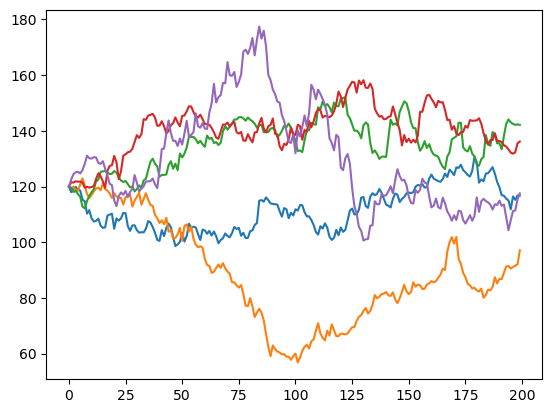

In [13]:
plt.plot(jnp.exp(logprice_paths[5:10, :]).T)
plt.show()

In [14]:
@jax.jit
def payoff(K, r, T, logprice):
    return jnp.exp(-r*T)*jnp.mean(jnp.maximum(jnp.exp(logprice) - K, 0))

@jax.jit
def smooth_payoff(K, r, T, logprice, smoothness = 10.0):
    return jnp.exp(-r*T)*jnp.mean(jax.nn.softplus(smoothness * (jnp.exp(logprice) - K)) / smoothness)

def calc_mc_price(kappa, mean, gamma, rho, v0, K, T, S, r, N_paths, N_steps, key):
    logprice = get_logprice_paths(kappa, mean, gamma, rho, v0, T, S, r, N_paths, N_steps, key)[:, -1]
    return smooth_payoff(K, r, T, logprice)

calc_mc_price = jax.jit(calc_mc_price, static_argnums=(9, 10))

In [15]:
print(payoff(K, r, T, logprice_paths[:, -1]))
print(smooth_payoff(K, r, T, logprice_paths[:, -1]))

27.054464
27.054613


In [16]:
delta_ = jax.grad(calc_mc_price, argnums=7)
gamma_ = jax.grad(delta_, argnums=7)
vega_ = jax.grad(calc_mc_price, argnums=4)

In [18]:
%%time
price_1, delta_1 = jax.value_and_grad(calc_mc_price, argnums=7)(*heston_params.to_array(), K, T, S, r, N_paths, N_steps, key)
gamma_1 = gamma_(*heston_params.to_array(), K, T, S, r, N_paths, N_steps, key)
vega_1 = vega_(*heston_params.to_array(), K, T, S, r, N_paths, N_steps, key)


print(price_1, delta_1, gamma_1, vega_1)

27.054613 0.844153 0.0063354457 27.991756
CPU times: user 255 ms, sys: 79.4 ms, total: 335 ms
Wall time: 326 ms


In [24]:
def softplus_call(S, K, smoothness=10.0):
    """Call payoff using softplus approximation"""
    return jax.nn.softplus(smoothness * (S - K)) / smoothness

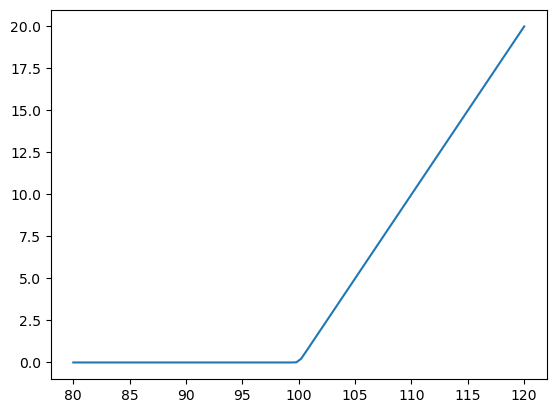

In [25]:
S_tmp = np.linspace(K-20, K + 20, 100 )
plt.plot(S_tmp, softplus_call(S_tmp, K))

In [26]:
from tqdm import tqdm

In [30]:
## Price surface computation
NK = 20
NT = 20
K_mesh, T_mesh = np.meshgrid(np.linspace(90, 160, NK), np.linspace(0.1, 3, NT))

def mc_mesh(K_mesh, T_mesh):
    Prices = jnp.zeros((NT, NK))
    Deltas = jnp.zeros((NT, NK))
    Gammas = jnp.zeros((NT, NK))
    Vegas = jnp.zeros((NT, NK))
    for i in tqdm(np.arange(NT), desc = 'Outer loop', leave = True, position = 0, dynamic_ncols = True):
        for j in np.arange(NK):
            Prices = Prices.at[i,j].set(calc_mc_price(*heston_params.to_array(), K_mesh[i,j], T_mesh[i,j], S, r, N_paths, N_steps, key))
            Deltas = Deltas.at[i,j].set(delta_(*heston_params.to_array(), K_mesh[i,j], T_mesh[i,j], S, r, N_paths, N_steps, key))
            Gammas = Gammas.at[i,j].set(gamma_(*heston_params.to_array(), K_mesh[i,j], T_mesh[i,j], S, r, N_paths, N_steps, key))
            Vegas = Vegas.at[i,j].set(vega_(*heston_params.to_array(), K_mesh[i,j], T_mesh[i,j], S, r, N_paths, N_steps, key))
    return Prices, Deltas, Gammas, Vegas

In [31]:
%%time

prices, deltas, gammas, vegas = mc_mesh(K_mesh, T_mesh)

Outer loop:   0%|                                        | 0/20 [00:00<?, ?it/s]2025-04-02 18:09:21.198624: E external/xla/xla/service/gpu/gpu_hlo_schedule.cc:654] The byte size of input/output arguments (1712400536) exceeds the base limit (1673003008). This indicates an error in the calculation!
2025-04-02 18:09:21.229335: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3021] Can't reduce memory use below 0B (0 bytes) by rematerialization; only reduced to 1.63GiB (1753602584 bytes), down from 1.63GiB (1753602584 bytes) originally
2025-04-02 18:09:22.587970: E external/xla/xla/service/gpu/gpu_hlo_schedule.cc:654] The byte size of input/output arguments (1712400072) exceeds the base limit (1673003008). This indicates an error in the calculation!
2025-04-02 18:09:22.594991: W external/xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3021] Can't reduce memory use below 0B (0 bytes) by rematerialization; only reduced to 38.72MiB (40600480 bytes), down from

CPU times: user 1min 47s, sys: 35 s, total: 2min 22s
Wall time: 2min 18s


In [32]:
fig = make_subplots(rows = 1, cols = 4, specs = \
                    [[{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}]],\
                    subplot_titles = ('price','delta','gamma','vega'),
                    horizontal_spacing = 0.001
                )


fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = prices, showscale = False), row = 1, col = 1)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = deltas, showscale = False), row = 1, col = 2)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = gammas, showscale = False), row = 1, col = 3)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = vegas, showscale = False), row = 1, col = 4)

fig.update_layout(
    title_text='Heston vanilla price with S = 100',
    height=1500,
    width=1800,
    scene1 = dict(zaxis_title = 'price', xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene2 = dict(zaxis_title = 'delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene3 = dict(zaxis_title = 'gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene4 = dict(zaxis_title = 'vega',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    
)
fig.show()

# Heston model

The Heston model under EMM $\mathbb{Q}$ reads:

$$\begin{array}{l}
\mathrm{d} S(t)=r S(t) \mathrm{d} t+\sqrt{v(t)} S(t) \mathrm{d} W_s^{\mathbb{Q}}(t), \quad S\left(t_0\right)=S_0>0 \\
\mathrm{~d} v(t)=\kappa(\bar{v}-v(t)) \mathrm{d} t+\gamma \sqrt{v(t)} \mathrm{d} W_v^{\mathbb{Q}}(t), \quad v\left(t_0\right)=v_0>0 .
\end{array}$$

Where Brownian motions are correlated $dW_s^{\mathbb{Q}}(t)dW_v^{\mathbb{Q}}(t) = \rho dt$

In order to simulate $S(t)$ process we use Cholesky decomposition to represent correlated Brownian motions $W_s^{\mathbb{Q}}(t), \; W_v^{\mathbb{Q}}(t)$ using independent Brownian motions $\widetilde{W}_s^{\mathbb{Q}}(t), \; \widetilde{W}_v^{\mathbb{Q}}(t)$ in the following way: 

$dW_s^{\mathbb{Q}}(t) = \rho d\widetilde{W}_v^{\mathbb{Q}}(t) + \sqrt{1 - \rho^2} d\widetilde{W}_s^{\mathbb{Q}}(t)$

$dW_v^{\mathbb{Q}}(t) = d\widetilde{W}_v^{\mathbb{Q}}(t)$

Under such transformation BMs are still correlated $dW_s^{\mathbb{Q}}(t)dW_v^{\mathbb{Q}}(t) = \rho dt$.

Then the model reads:

$$\begin{array}{l}
\mathrm{d} S(t)=r S(t) \mathrm{d} t+\sqrt{v(t)} S(t) \left[\rho d\widetilde{W}_v^{\mathbb{Q}}(t) + \sqrt{1 - \rho^2} d\widetilde{W}_s^{\mathbb{Q}}(t)\right] , \quad S\left(t_0\right)=S_0>0 \\
\mathrm{~d} v(t)=\kappa(\bar{v}-v(t)) \mathrm{d} t+\gamma \sqrt{v(t)} d\widetilde{W}_v^{\mathbb{Q}}(t), \quad v\left(t_0\right)=v_0>0 .
\end{array}$$


In [4]:
S = 120
T = 1
K = 100
r = 0.03

In [5]:
@dataclass
class HestonParams:
    kappa: float 
    mean: float #\bar{v} in the above notation
    gamma: float
    rho:float
    v0:float

    def to_array(self):
        return np.array([self.kappa, self.mean, self.gamma, self.rho, self.v0])

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

## CIR process

The first step in simulating asset price paths under Heston dynamics is to simulate CIR process:


$$dv_t = \kappa(\overline{v}- v_t)dt + \gamma \sqrt{v_t}dW_t, \quad v(t_0) > 0$$

Feller condition: $$ 2 \kappa \overline{v} > \gamma^2$$

If Fellers' condition holds, then: $$v(t) > 0, \quad  \text{w.p.} 1 \; \forall t$$

### Exact simulation

Conditional on $v(s),  s<t$, the distribution at time $t$ is given by:

$$v(t) \mid v(s) \sim \bar{c}(t, s) \cdot \chi^2(\delta, \bar{\kappa}(t, s)), t>s>0$$

with

$$\bar{c}(t, s)=\frac{\gamma^2}{4 \kappa}\left(1-\mathrm{e}^{-\kappa(t-s)}\right), \quad \delta=\frac{4 \kappa \bar{v}}{\gamma^2}, \quad \bar{\kappa}(t, s)=\frac{4 \kappa \mathrm{e}^{-\kappa(t-s)}}{\gamma^2\left(1-\mathrm{e}^{-\kappa(t-s)}\right)} v(s)$$


This gives a way for exact simulation of the CIR process:


$$\begin{aligned}
\bar{c}\left(t_{i+1}, t_i\right) & =\frac{\gamma^2}{4 \kappa}\left(1-\mathrm{e}^{-\kappa\left(t_{i+1}-t_i\right)}\right) \\
\bar{\kappa}\left(t_{i+1}, t_i\right) & =\frac{4 \kappa \mathrm{e}^{-\kappa\left(t_{i+1}-t_i\right)}}{\gamma^2\left(1-\mathrm{e}^{-\kappa\left(t_{i+1}-t_i\right)}\right)} v_i . \\
v_{i+1} & =\bar{c}\left(t_{i+1}, t_i\right) \chi^2\left(\delta, \bar{\kappa}\left(t_{i+1}, t_i\right)\right)
\end{aligned}$$


In [57]:
@njit(parallel = True)
def get_es_cir_paths(params, T, N_paths, N_steps):
    kappa, mean, gamma, rho, v0 = params
    dt = T/(N_steps - 1)
    t = np.linspace(0, T, N_steps)
    v = np.zeros((N_paths, N_steps))
    v[:, 0] = np.ones(N_paths)*v0
    c_bar = gamma**2/4/kappa*(1 - np.exp(-kappa*dt))
    df = 4*kappa*mean/gamma**2
    kappa_bar = 4*kappa*np.exp(-kappa*dt)/gamma**2/(1 - np.exp(-kappa*dt))

    for i in numba.prange(N_paths):
        for j in range(N_steps - 1):
            v[i, j+1] = c_bar*np.random.noncentral_chisquare(df, kappa_bar*v[i, j], 1)[0]
    return v

In [60]:
N_paths = 300000
N_steps = 300

%time v = get_es_cir_paths(heston_params.to_array(), T, N_paths, N_steps)

CPU times: user 31.1 s, sys: 480 ms, total: 31.5 s
Wall time: 4.28 s


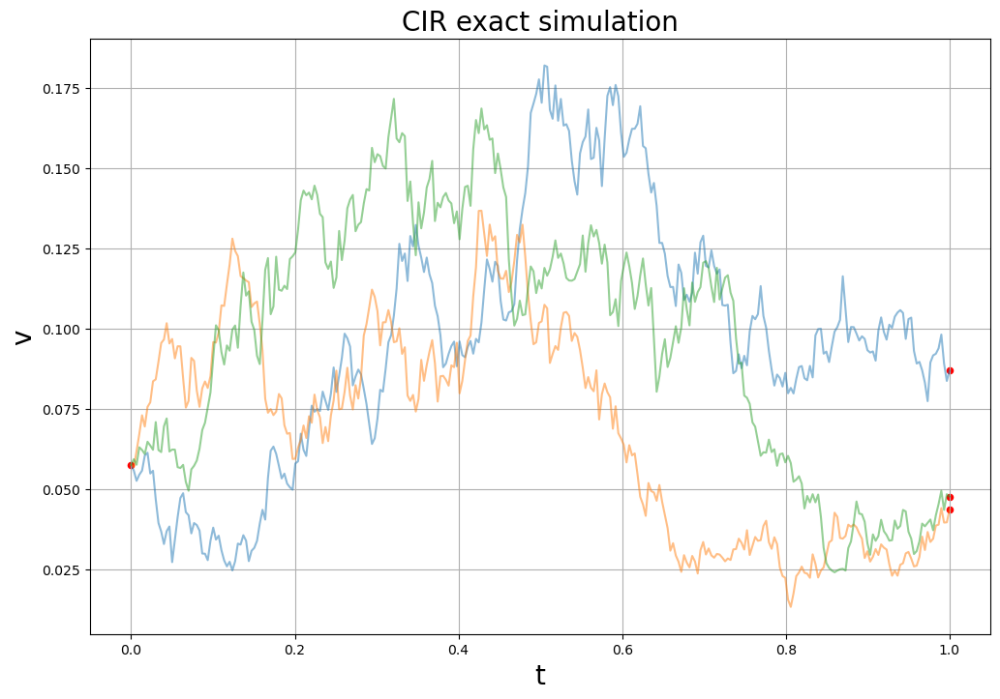

In [59]:
t = np.linspace(0, T, N_steps)
plt.figure(figsize = (12, 8))
plt.plot(t, v[:3, :].T, alpha = 0.5)
plt.scatter(np.ones(3)*T, v[:3, -1], c = 'red', s = 20)
plt.scatter(0.0, heston_params.to_array()[-1], c  = 'red', s = 20)
plt.title('CIR exact simulation', fontsize = 20)
plt.xlabel('t', fontsize = 20)
plt.ylabel('v', fontsize = 20)
plt.grid()

So, simulating 300000 paths with 300 time steps takes around 4s.

Sampling from ncx2 is too expensive, so other methods for simulating CIR paths should be employed.

### QE scheme

Quadratic exponential scheme for the CIR process is based on the non-central chi-2 dist. approximation.

In order to speed up computations we employ cuda numba API.

In [6]:
### CIR MODELING

#device function to compute moments
@cuda.jit(device = True, fastmath = True)
def get_cir_moments_cuda(kappa, mean, gamma, v0, dt):
    '''
    returns E[v|v0] and Var[v|v0] of a CIR process,
    where v = v(t0 + dt), v0 = v(t0);
    '''
    c_bar = gamma**2/4/kappa*(1 - math.exp(-kappa*dt))
    kappa_bar = 4*kappa*math.exp(-kappa*dt)/gamma**2/(1 - math.exp(-kappa*dt))*v0
    df = 4*kappa*mean/gamma**2
    mu = c_bar*(df + kappa_bar)
    var = c_bar**2*(2*df + 4*kappa_bar)
    
    return mu, var

@cuda.jit(fastmath = True)
def qe_kernel(out, rng_states, kappa, mean, gamma, v0, T, N_paths, N_steps):
    dt = T/(N_steps-1)
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x

    for i in range(ii, N_paths, stride):
        out[i, 0] = v0
        for j in range(N_steps-1):
            mu, var = get_cir_moments_cuda(kappa, mean, gamma, out[i, j], dt)
            if var/mu**2 <= 1.5:
                z = xoroshiro128p_normal_float64(rng_states, ii)
                b = math.sqrt(2*mu**2/var - 1 + math.sqrt(2*mu**2/var)*math.sqrt(2*mu**2/var - 1))
                a = mu/(1 + b**2)
                out[i, j+1] =  a*(b+z)**2
            else:
                z = xoroshiro128p_uniform_float64(rng_states, ii)
                c = (var/mu**2 - 1 )/(var/mu**2 + 1)
                d = (1 - c)/mu
                out[i, j+1] = math.log((1-c)/(1-z+1e-8))/d*(z>c)

def update_cir_qe_paths(params, T, N_paths, N_steps):
    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1))//threads_per_block
    global out_cir
    global rng_states_cir

    #Memory management routine: Delete the old device array and create a new one if N_paths or N_steps were changed.
    if "out_cir" in globals() and out_cir.shape == (N_paths, N_steps):
        pass
    else:
        try:
            del out_cir, rng_states_cir
            gc.collect()
        except: pass
        #rng_states_cir = create_xoroshiro128p_states(threads_per_block*blocks_per_grid, seed = 37)
        out_cir = cuda.device_array((N_paths, N_steps), dtype = 'float64')
        
    rng_states_cir = create_xoroshiro128p_states(threads_per_block*blocks_per_grid, seed = 37)
    kappa, mean, gamma, _, v0 = params
    qe_kernel[blocks_per_grid, threads_per_block](out_cir, rng_states_cir, kappa, mean, gamma, v0, T, N_paths, N_steps)

In [7]:
%%time
N_paths = 300000
N_steps = 300
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
cuda.synchronize()

CPU times: user 2.15 s, sys: 281 ms, total: 2.43 s
Wall time: 2.45 s


Using cuda-numba API allows to allocate ~500_000x500 float64 numbers in 2Gb GPU

In [66]:
##Deletes all the device arrays from memory
device_arrays = {name: var for name, var in globals().items() if isinstance(var, numba.cuda.cudadrv.devicearray.DeviceNDArray)}
for name in device_arrays.keys():
    del globals()[name]
    print(f"Deleting device array: {name}")

del device_arrays
gc.collect()

Deleting device array: rng_states_cir
Deleting device array: out_cir


1105

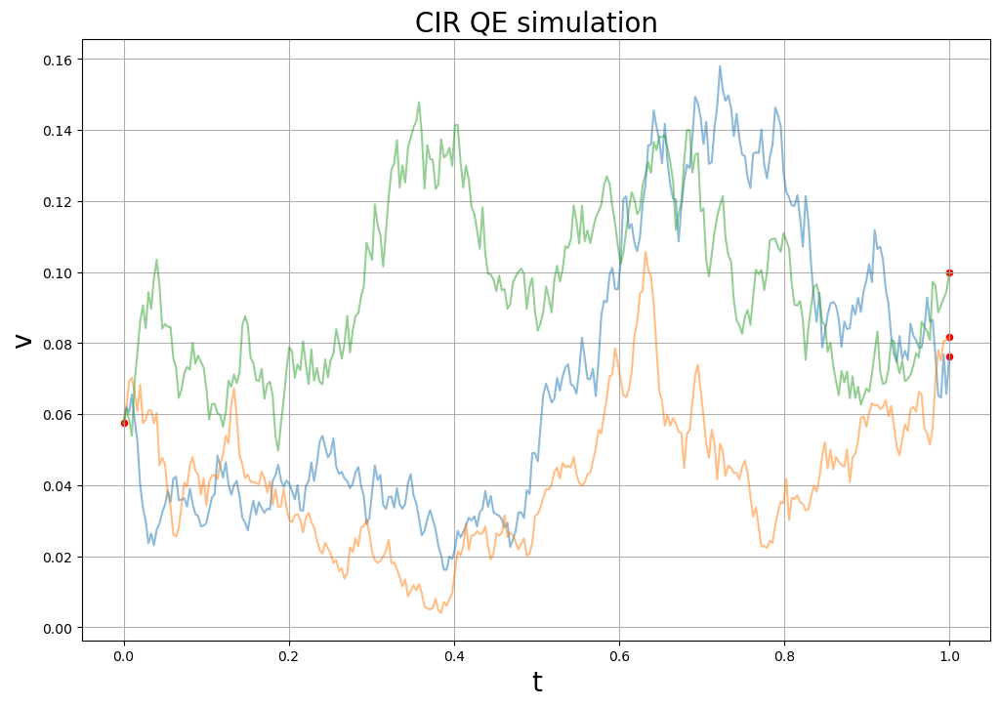

In [69]:
t = np.linspace(0, T, N_steps)
plt.figure(figsize = (12, 8))
plt.plot(t, out_cir[:3, :].copy_to_host().T, alpha = 0.5)
plt.scatter(0.0, heston_params.to_array()[-1], c  = 'red', s = 20)
plt.scatter(np.ones(3)*T, out_cir[:3, -1].copy_to_host(), c = 'red', s = 20)
plt.title('CIR QE simulation', fontsize = 20)
plt.xlabel('t', fontsize = 20)
plt.ylabel('v', fontsize = 20)
plt.grid()

Using the QE scheme with CUDA acceleration sped up computations by 8x(with out moving device array to host).

### Comparison of schemes

One way to check how well does QE scheme works is to compare $v(T)$ distribution.

In [71]:
%%time
N_paths = 300000
N_steps = 300
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
cir_terminal_values = out_cir.copy_to_host()[:, -1]

CPU times: user 741 ms, sys: 47.9 ms, total: 789 ms
Wall time: 787 ms


In [72]:
%%time

#Exact dist.
tmp = get_es_cir_paths(heston_params.to_array(), T, N_paths, N_steps)
tmp = tmp[:, -1]

CPU times: user 34.5 s, sys: 476 ms, total: 35 s
Wall time: 4.62 s


In [73]:
print('Exact scheme mean  = ', np.mean(tmp).round(7))
print('Exact scheme variance  = ', np.var(tmp).round(7))
print('QE scheme mean  = ', np.mean(cir_terminal_values).round(7))
print('QE scheme variance  = ', np.var(cir_terminal_values).round(7))

Exact scheme mean  =  0.0830988
Exact scheme variance  =  0.0030106
QE scheme mean  =  0.0831613
QE scheme variance  =  0.0030032


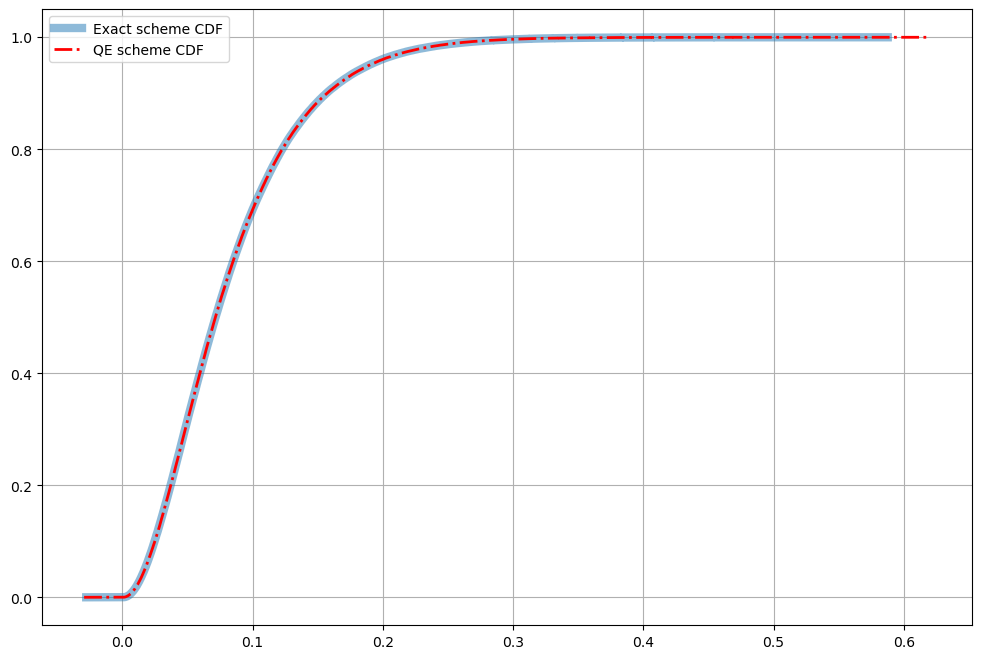

In [74]:
x = np.linspace(np.min(cir_terminal_values), np.max(cir_terminal_values), 1000)
plt.figure(figsize = (12, 8))
sp.stats.ecdf(tmp).cdf.plot(lw = 6,  label = 'Exact scheme CDF', alpha = 0.5)
sp.stats.ecdf(cir_terminal_values).cdf.plot(lw = 2, ls = '-.', c = 'red', label = 'QE scheme CDF')
plt.grid()
plt.legend()
plt.show()
plt.show()

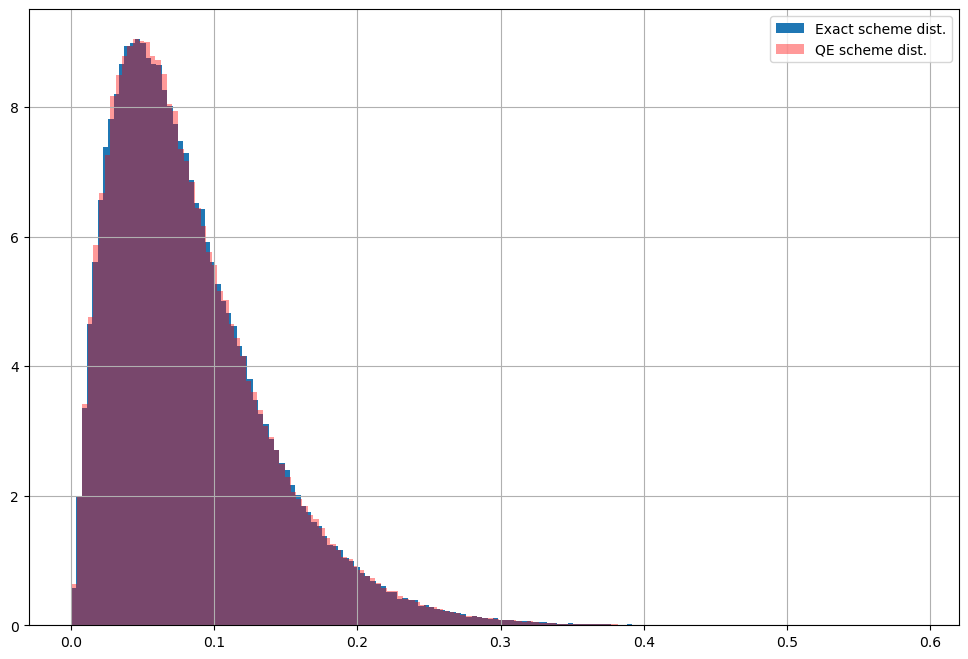

In [75]:
plt.figure(figsize = (12, 8))
plt.hist(tmp, bins = 150, density=True, label = 'Exact scheme dist.')
plt.hist(cir_terminal_values, bins = 150, density=True, alpha = 0.4, color = 'red', label = 'QE scheme dist.')
plt.grid()
plt.legend()
plt.show()
plt.show()

## Asset price simulation

In [8]:
@cuda.jit(fastmath = True)
def logprice_kernel(out, rng_states, out_cir, k0, k1, k2, k3, S, N_paths, N_steps):
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x

    for i in range(ii, N_paths, stride):
        out[i, 0] = math.log(S)
        for j in range(N_steps-1):
            z = xoroshiro128p_normal_float64(rng_states, ii)
            out[i, j+1] = out[i, j] + k0 + k1*out_cir[i, j] + k2*out_cir[i, j+1] + math.sqrt(k3*out_cir[i,j] + 1e-10)*z


def update_logprice_vals(params, T, S, r, N_paths, N_steps):
    global out_logprice_val
    global rng_states_price
    global out_cir
    
    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1))//threads_per_block

    if "out_logprice_val" in globals() and out_logprice_val.shape == (N_paths, N_steps):
        pass
    else:
        try:
            del out_logprice_val, rng_states_price
            gc.collect()
        except: pass
        #rng_states_price = create_xoroshiro128p_states(threads_per_block*blocks_per_grid, seed = 38)
        out_logprice_val = cuda.device_array((N_paths, N_steps), dtype = 'float64')
    rng_states_price = create_xoroshiro128p_states(threads_per_block*blocks_per_grid, seed = 38)
    kappa, mean, gamma, rho, v0 = params
    
    dt = T/(N_steps-1)
    k0 = (r - rho/gamma*kappa*mean)*dt
    k1 = (rho/gamma*kappa - 0.5)*dt - rho/gamma
    k2 = rho/gamma
    k3 = (1 - rho**2)*dt
    logprice_kernel[blocks_per_grid, threads_per_block](out_logprice_val, rng_states_price, out_cir, k0, k1, k2, k3, S, N_paths, N_steps)

In [16]:
%%time

N_paths = 300000
N_steps = 300

#Update CIR paths -> update asset price paths
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)
cuda.synchronize()

CPU times: user 1.53 s, sys: 4.96 ms, total: 1.53 s
Wall time: 1.53 s


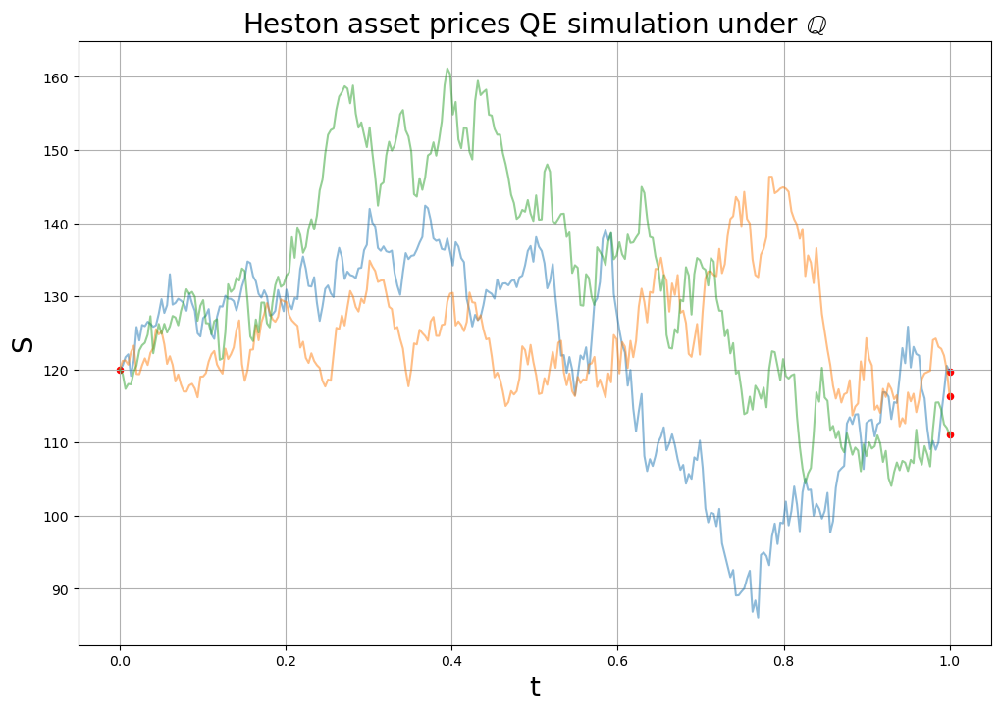

In [17]:
t = np.linspace(0, T, N_steps)
plt.figure(figsize = (12, 8))
plt.plot(t, np.exp(out_logprice_val[:3, :].copy_to_host()).T, alpha = 0.5)
plt.scatter(0.0, S, c  = 'red', s = 20)
plt.scatter(np.ones(3)*T, np.exp(out_logprice_val[:3, -1].copy_to_host()), c = 'red', s = 20)
plt.title(r'Heston asset prices QE simulation under $\mathbb{Q}$', fontsize = 20)
plt.xlabel('t', fontsize = 20)
plt.ylabel('S', fontsize = 20)
plt.grid()

## Vanilla MC pricing/greeks

In [11]:
##Efficient summation for device array
@cuda.jit
def block_reduce_sum(arr, result):
    shared = cuda.shared.array(128, dtype=numba.float64) 
    tid = cuda.threadIdx.x
    i = cuda.grid(1)

    if i < arr.size:
        shared[tid] = arr[i]
    else:
        shared[tid] = 0  

    cuda.syncthreads()

    stride = 64
    while stride > 0:
        if tid < stride:
            shared[tid] += shared[tid + stride]
        stride //= 2
        cuda.syncthreads()

    if tid == 0:
        cuda.atomic.add(result, 0, shared[0])

Given simulated asset price paths under EMM, we calculate price of a European option as follows:

$V(T, S) = e^{-rT}\mathbb{E}_{\mathbb{Q}}\left[V(0, S_T)|S_0 = S \right]\approx e^{-rT} \frac{1}{N_{paths}} \sum_\limits{i = 1}^{N_{paths}}V(0, S_T^{(i)})$

$V(T, s)$ - option value, $T$ - time to maturity, $s$ - current asset price;

Using pathwise sensitivities approach:

Delta: $\frac{\partial V}{\partial S(t_0)} = e^{-r(T-t_0)}\mathbb{E}_{\mathbb{Q}}\left[\frac{S(T)}{S(t_0)}I(S(T) > K)|\mathcal{F}(t_0) \right]$

For the simplicity sake we use central difference method to approximate gamma and vega of an option;


In [12]:
@cuda.jit(fastmath = True)
def payoff_kernel(out_logprice_val, payoffs, K, N_paths, N_steps, call = True):
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x
    for i in range(ii, N_paths, stride):
        payoffs[i] = max(math.exp(out_logprice_val[i, -1]) - K, 0)*call + max(K - math.exp(out_logprice_val[i, -1]), 0)*(1 - call)

def calc_vanilla_price_mc(T, r, K, N_paths, N_steps, call = True):
    global mc_price
    global payoffs
    global out_logprice_val

    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1)) // threads_per_block
    mc_price = cuda.to_device(np.zeros(1, dtype = 'float64'))
    
    if "payoffs" in globals() and payoffs.shape == (N_paths, ):
        pass
    else:
        try:
            del payoffs
            gc.collect()
        except: pass
        payoffs = cuda.device_array(N_paths, dtype = 'float64')
    
    payoff_kernel[blocks_per_grid, threads_per_block](out_logprice_val, payoffs, K, N_paths, N_steps, call)
    block_reduce_sum[blocks_per_grid, threads_per_block](payoffs, mc_price)
    return mc_price.copy_to_host()[0]*math.exp(-r*T)/N_paths

In [13]:
S = 120.0
T = 1.0
K = 100.0
r = 0.03

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

N_paths = 300000
N_steps = 300

In [14]:
%%time
#Update CIR paths -> update asset price paths -> get option price
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)
cuda.synchronize()

CPU times: user 1.97 s, sys: 13 ms, total: 1.99 s
Wall time: 1.99 s


In [15]:
calc_vanilla_price_mc(T, r, K, N_paths, N_steps)

27.00903675489683

In [43]:
#Sensitivities
@cuda.jit(fastmath = True)
def delta_kernel(out_logprice_val, deltas_column, K, N_paths, N_steps, call = True):
    ii = cuda.grid(1)
    stride = cuda.gridDim.x*cuda.blockDim.x
    for i in range(ii, N_paths, stride):
        tmp = math.exp(out_logprice_val[i, -1])
        deltas_column[i] = tmp*(tmp > K)

def calc_vanilla_delta_mc(T, r, K, S, N_paths, N_steps, call = True):
    global mc_delta
    global deltas_column
    global out_logprice_val

    threads_per_block = 128
    blocks_per_grid = (N_paths + (threads_per_block - 1)) // threads_per_block
    mc_delta = cuda.to_device(np.zeros(1, dtype = 'float64'))
    
    if "deltas_column" in globals() and deltas_column.shape == (N_paths, ):
        pass
    else:
        try:
            del deltas_column
            gc.collect()
        except: pass
        deltas_column = cuda.device_array(N_paths, dtype = 'float64')
    
    delta_kernel[blocks_per_grid, threads_per_block](out_logprice_val, deltas_column, K, N_paths, N_steps, call)
    block_reduce_sum[blocks_per_grid, threads_per_block](deltas_column, mc_delta)
    return mc_delta.copy_to_host()[0]*math.exp(-r*T)/N_paths/S

In [107]:
def delta_diff(params, T, r, S, K:np.array, rel):
    n = K.size
    dS = rel*S
    update_cir_qe_paths(params, T, N_paths, N_steps)
    
    update_logprice_vals(params, T, S+dS, r, N_paths, N_steps)
    mc_prices_1 = np.zeros(n)
    for i in range(n):
        mc_prices_1[i] = calc_vanilla_price_mc(T, r, K[i], N_paths, N_steps)

    update_logprice_vals(params, T, S-dS, r, N_paths, N_steps)
    mc_prices_2 = np.zeros(n)
    for i in range(n):
        mc_prices_2[i] = calc_vanilla_price_mc(T, r, K[i], N_paths, N_steps)
    return (mc_prices_1 - mc_prices_2)/2/dS
    
def gamma_diff(params, T, r, S, K:np.array, rel):
    mc_deltas_1 = delta_diff(params, T, r, S*(1+rel), K, 0.05)
    mc_deltas_2 = delta_diff(params, T, r, S*(1-rel), K, 0.05)
    dS = S*rel
    return (mc_deltas_1 - mc_deltas_2)/2/dS


def vega_diff(params, T, r, S, K:np.array, rel):
    n = K.size
    params_1 = copy.deepcopy(params)
    params_1[-1] = params_1[-1]*( 1 + rel)

    params_2 = copy.deepcopy(params)
    params_2[-1] = params_2[-1]*( 1 - rel)
    
    update_cir_qe_paths(params_1, T, N_paths, N_steps)
    update_logprice_vals(params_1, T, S, r, N_paths, N_steps)
    mc_prices_1 = np.zeros(n)
    for i in range(n):
        mc_prices_1[i] = calc_vanilla_price_mc(T, r, K[i], N_paths, N_steps)

    update_cir_qe_paths(params_2, T, N_paths, N_steps)
    update_logprice_vals(params_2, T, S, r, N_paths, N_steps)
    mc_prices_2 = np.zeros(n)
    for i in range(n):
        mc_prices_2[i] = calc_vanilla_price_mc(T, r, K[i], N_paths, N_steps)
    dv = params[-1]*rel
    return (mc_prices_1 - mc_prices_2)/2/dv

In [131]:
S = 120
T = 1
K = 100
r = 0.03

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

N_paths = 100000
N_steps = 100

In [136]:
%%time
#Update CIR paths -> update asset price paths -> get option price
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)
cuda.synchronize()

CPU times: user 179 ms, sys: 14 μs, total: 179 ms
Wall time: 178 ms


In [137]:
%%time
calc_vanilla_price_mc(T, r, K, N_paths, N_steps)

CPU times: user 1.22 ms, sys: 1 ms, total: 2.22 ms
Wall time: 1.69 ms


27.025296807778158

In [138]:
%%time
calc_vanilla_delta_mc(T, r, K, S, N_paths, N_steps)

CPU times: user 906 μs, sys: 968 μs, total: 1.87 ms
Wall time: 1.61 ms


0.8468539543843205

In [139]:
## Price surface computation
NK = 100
NT = 25
K_mesh, T_mesh = np.meshgrid(np.linspace(90, 160, NK), np.linspace(0.1, 3, NT))

def mc_mesh(K_mesh, T_mesh):
    Prices = np.zeros((NT, NK))
    Deltas = np.zeros((NT, NK))
    for i in range(NT):
        update_cir_qe_paths(heston_params.to_array(), T_mesh[i,0], N_paths, N_steps)
        update_logprice_vals(heston_params.to_array(), T_mesh[i,0], S, r, N_paths, N_steps)
        for j in range(NK):
            Prices[i,j] = calc_vanilla_price_mc(T_mesh[i,j], r, K_mesh[i,j], N_paths, N_steps, call = True)
            Deltas[i,j] = calc_vanilla_delta_mc(T_mesh[i, j], r, K_mesh[i,j], S, N_paths, N_steps)
    return Prices, Deltas         

In [140]:
def greeks_diff_mesh(K_mesh, T_mesh):
    diff_deltas = np.zeros((NT, NK))
    diff_gammas = np.zeros((NT, NK))
    diff_vegas = np.zeros((NT, NK))
    for i in range(NT):
        print(i)
        diff_deltas[i, :] = delta_diff(heston_params.to_array(), T_mesh[i, 0], r, S, K_mesh[0, :], 0.05)
        diff_gammas[i, :] = gamma_diff(heston_params.to_array(), T_mesh[i, 0], r, S, K_mesh[0, :], 0.05)
        diff_vegas[i, :] = vega_diff(heston_params.to_array(), T_mesh[i, 0], r, S, K_mesh[0, :], 0.05)
    return diff_deltas, diff_gammas, diff_vegas

In [141]:
%%time

diff_deltas, diff_gammas, diff_vegas  = greeks_diff_mesh(K_mesh, T_mesh)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
CPU times: user 42.2 s, sys: 69 ms, total: 42.2 s
Wall time: 42.2 s


In [ ]:
fig = make_subplots(rows = 1, cols = 3, specs = \
                    [[{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}]],\
                    subplot_titles = ('diff delta','diff vega','diff gamma'),
                    horizontal_spacing = 0.001
                )


fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = diff_deltas, showscale = False), row = 1, col = 1)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = diff_vegas, showscale = False), row = 1, col = 2)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = diff_gammas, showscale = False), row = 1, col = 3)

fig.update_layout(
    title_text='Heston vanilla price with S = 100',
    height=1500,
    width=1800,
    scene1 = dict(zaxis_title = 'delta', xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene2 = dict(zaxis_title = 'vega',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene3 = dict(zaxis_title = 'gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity')
)
fig.show()

In [143]:
%%time
mc_prices, mc_deltas = mc_mesh(K_mesh, T_mesh)

CPU times: user 7.08 s, sys: 16.1 ms, total: 7.09 s
Wall time: 7.09 s


In [ ]:
fig = make_subplots(rows = 2, cols = 4, specs = \
                    [[{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}],
                     [{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}]],\
                    subplot_titles = ('MC simulation','MC delta','MC vega','MC gamma',\
                                      'COS method', 'COS delta', 'COS vega','COS gamma')
                    )


fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = mc_prices, showscale = False), row = 1, col = 1)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = mc_deltas, showscale = False), row = 1, col = 2)
#fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Z_mc, showscale = False), row = 1, col = 3)
#fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Z_mc, showscale = False), row = 1, col = 4)

fig.update_layout(
    title_text='Heston vanilla price with S = 100',
    height=1500,
    width=1800,
    scene1 = dict(zaxis_title = 'call price', xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene2 = dict(zaxis_title = 'delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene3 = dict(zaxis_title = 'vega',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene4 = dict(zaxis_title = 'gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene5 = dict(zaxis_title = 'call price',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene6 = dict(zaxis_title = 'delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene7 = dict(zaxis_title = 'vega',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene8 = dict(zaxis_title = 'gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity')
)
fig.show()

## Vanilla COS pricing/greeks

In the Hedge part of the notebook there is a need to compute options delta, gamma, vega for each path for each timestep.
So, in order to make this task feasible we need to perform operations of GPU. So functions for that purpose will be defined in their plain form and then modified to be able to compute on GPU and vectorized CPU.

In [125]:
@njit
def ChF(kappa, mean, gamma, rho, v0, T, r, u):
    i = complex(0, 1)
    D1 = cmath.sqrt((kappa - i*rho*gamma*u)**2 + (u**2 + i*u)*gamma**2)
    g = (kappa - i*rho*gamma*u - D1)/(kappa - i*rho*gamma*u + D1)
    return cmath.exp(i*u*r*T + v0/gamma**2*(1 - cmath.exp(-D1*T))/(1 - g*cmath.exp(-D1*T))*(kappa-i*rho*gamma*u - D1))*\
        cmath.exp(kappa*mean/gamma**2*( T*(kappa - i*rho*gamma*u - D1) - 2*cmath.log((1 - g*cmath.exp(-D1*T))/(1-g))))

@njit
def Chi_k(k, c, d, a, b):
    p1 = math.cos(k*math.pi*(d-a)/(b-a))*math.exp(d)
    p2 = math.cos(k*math.pi*(c-a)/(b-a))*math.exp(c)
    p3 = k*math.pi/(b-a)*math.sin(k*math.pi*(d-a)/(b-a))*math.exp(d)
    p4 = k*math.pi/(b-a)*math.sin(k*math.pi*(c-a)/(b-a))*math.exp(c)
    return (1 + (k*math.pi/(b-a))**2)**(-1)*(p1 - p2 + p3 - p4)


@njit
def Psi_k(k, c, d, a, b):
    if k == 0:
        return d - c
    else:
        p1 = math.sin(k*math.pi*(d-a)/(b-a))
        p2 = math.sin(k*math.pi*(c-a)/(b-a))
        return (b-a)/k/math.pi*(p1-p2)

@njit
def Uk(k, a, b, call):
    return 2/(b-a)*(Chi_k(k, 0, b, a, b) - Psi_k(k, 0, b, a, b)) if call == True else 2/(b-a)*(-Chi_k(k, a, 0, a, b) + Psi_k(k, a, 0, a, b))

In [127]:
%%time
ChF(*heston_params.to_array(), T, r, 2)

CPU times: user 71 μs, sys: 3 μs, total: 74 μs
Wall time: 81.8 μs


(0.7268765992558937+0.1085633921095652j)

In [128]:
@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_price_cos(kappa, mean, gamma, rho, v0, T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
        res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res

@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_delta_cos(kappa, mean, gamma, rho, v0, T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
            res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*(i*j*math.pi/(b-a)/S)*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res

@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_gamma_cos(kappa, mean, gamma, rho, v0, T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
            res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*((i*j*math.pi/(b-a)/S)**2 - (i*j*math.pi/(b-a)/S**2))*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res 

@njit
def C_bar(kappa, mean, gamma, rho, v0, T, u):
    i = complex(0, 1)
    D1 = cmath.sqrt((kappa - i*rho*gamma*u)**2 + (u**2 + i*u)*gamma**2)
    g = (kappa - i*rho*gamma*u - D1)/(kappa - i*rho*gamma*u + D1)
    a1 = -0.5*(u**2 + i*u)
    a2 = kappa - gamma*rho*i*u
    a3 = 0.5*gamma**2
    r_ = 0.5/a3*(a2 - D1)
    return (1 - cmath.exp(-D1*T))/(1 - g*cmath.exp(-D1*T))*r_

@numba.vectorize(['float64(float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, float64, bool_)'], fastmath = True, target = 'parallel')
def calc_vanilla_vega_cos(kappa, mean, gamma, rho, v0 , T, S, r, K, a, b, N, call):
    i = complex(0, 1)
    res = 0.0
    for j in range(N):
            res +=  (1 - 0.5*(j == 0))*(ChF(kappa, mean, gamma, rho, v0, T, r, j*math.pi/(b-a))*Uk(j, a, b, call)*C_bar(kappa, mean, gamma, rho, v0, T, j*math.pi/(b-a))*cmath.exp(i*j*math.pi*(math.log(S/K)-a)/(b-a))).real
    res *= K*math.exp(-r*T)
    return res    

In [130]:
%%time
a = -5
b = 5
N = 2000
calc_vanilla_delta_cos(*heston_params.to_array(), T, S, r, K, a, b, N, True)

CPU times: user 2.26 ms, sys: 973 μs, total: 3.23 ms
Wall time: 1.8 ms


0.9410483124863813

In [86]:
%%time

NK = 40
NT = 100
K_mesh, T_mesh = np.meshgrid(np.linspace(90, 160, NK), np.linspace(0.1, 3, NT))

price_cos = calc_vanilla_price_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)
delta_cos = calc_vanilla_delta_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)
gamma_cos = calc_vanilla_gamma_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)
vega_cos = calc_vanilla_vega_cos(*heston_params.to_array(), T_mesh, S, r, K_mesh, a, b, N, True)

CPU times: user 23.5 s, sys: 48.7 ms, total: 23.6 s
Wall time: 3.47 s


In [87]:
fig = make_subplots(rows = 2, cols = 4, specs = \
                    [[{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}],
                     [{'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}, {'type' : 'surface'}]],\
                    subplot_titles = ('MC simulation','MC delta','MC vega','MC gamma',\
                                      'COS method', 'COS delta', 'COS vega','COS gamma')
                    )


#fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Z_mc, showscale = False), row = 1, col = 1)
#fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Z_mc, showscale = False), row = 1, col = 2)
#fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Z_mc, showscale = False), row = 1, col = 3)
#fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = Z_mc, showscale = False), row = 1, col = 4)

fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = price_cos, showscale = False), row = 2, col = 1)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = delta_cos, showscale = False), row = 2, col = 2)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = vega_cos, showscale = False), row = 2, col = 3)
fig.add_trace(go.Surface(x = K_mesh, y = T_mesh, z = gamma_cos, showscale = False), row = 2, col = 4)


fig.update_layout(
    title_text='Heston vanilla price with S = 100',
    height=1500,
    width=1800,
    scene1 = dict(zaxis_title = 'call price', xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene2 = dict(zaxis_title = 'delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene3 = dict(zaxis_title = 'vega',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene4 = dict(zaxis_title = 'gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene5 = dict(zaxis_title = 'call price',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene6 = dict(zaxis_title = 'delta',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene7 = dict(zaxis_title = 'vega',xaxis_title = 'Strike', yaxis_title = 'Maturity'),
    scene8 = dict(zaxis_title = 'gamma',xaxis_title = 'Strike', yaxis_title = 'Maturity')
)
fig.show()

## Calibration to market data

### Data downloading and preprocessing

In [60]:
msg1 = \
    {
    "method" : "public/get_instruments",
    "params" : {
        "currency" : "BTC",
        "kind" : "option"
    },
    "jsonrpc" : "2.0",
    "id" : 666
    }

msg2 = lambda instrument: {
    "id" : 666,
    "method" : "public/get_book_summary_by_instrument",
    "params" : {
        "instrument_name" : instrument
    },
    "jsonrpc" : "2.0"
    }

url = "https://test.deribit.com/api/v2"

# get list of currently trading options on Deribit
def get_options_names():
    response = requests.post(url, json=msg1)
    response_data = response.json()
    names = pd.json_normalize(response_data['result'])['instrument_name']
    names = list(names)
    return names
            
options_names = get_options_names()
call_options = [x for x in options_names if x[-1] == 'C']


#for a given instument returns pd df with info

def get_call_data(instrument):

    url = "https://test.deribit.com/api/v2"
    response = requests.post(url, json=msg2(instrument))
    response_data = response.json()
    return pd.json_normalize(response_data['result'])

data = list()
for item in call_options:
    print(item)
    data.append(get_call_data(item))

result = pd.concat(data, ignore_index=True)

result.to_csv('./tmp3.csv', index = False)

BTC-24MAR25-77000-C
BTC-24MAR25-78000-C
BTC-24MAR25-79000-C
BTC-24MAR25-80000-C
BTC-24MAR25-81000-C
BTC-24MAR25-81500-C
BTC-24MAR25-82000-C
BTC-24MAR25-82500-C
BTC-24MAR25-83000-C
BTC-24MAR25-83500-C
BTC-24MAR25-84000-C
BTC-24MAR25-84500-C
BTC-24MAR25-85000-C
BTC-24MAR25-85500-C
BTC-24MAR25-86000-C
BTC-24MAR25-86500-C
BTC-24MAR25-87000-C
BTC-24MAR25-88000-C
BTC-24MAR25-89000-C
BTC-24MAR25-90000-C
BTC-24MAR25-91000-C
BTC-25MAR25-77000-C
BTC-25MAR25-78000-C
BTC-25MAR25-79000-C
BTC-25MAR25-80000-C
BTC-25MAR25-81000-C
BTC-25MAR25-81500-C
BTC-25MAR25-82000-C
BTC-25MAR25-82500-C
BTC-25MAR25-83000-C
BTC-25MAR25-83500-C
BTC-25MAR25-84000-C
BTC-25MAR25-84500-C
BTC-25MAR25-85000-C
BTC-25MAR25-85500-C
BTC-25MAR25-86000-C
BTC-25MAR25-86500-C
BTC-25MAR25-87000-C
BTC-25MAR25-88000-C
BTC-25MAR25-89000-C
BTC-25MAR25-90000-C
BTC-25MAR25-91000-C
BTC-26MAR25-77000-C
BTC-26MAR25-78000-C
BTC-26MAR25-79000-C
BTC-26MAR25-80000-C
BTC-26MAR25-81000-C
BTC-26MAR25-81500-C
BTC-26MAR25-82000-C
BTC-26MAR25-82500-C


In [50]:
data = pd.read_csv('./options_data_10MAR.csv')

In [51]:
data

,high,low,last,instrument_name,bid_price,ask_price,open_interest,mark_price,creation_timestamp,price_change,volume,interest_rate,underlying_price,underlying_index,mark_iv,base_currency,estimated_delivery_price,quote_currency,volume_usd,mid_price
0,NaN,NaN,NaN,BTC-11MAR25-76000-C,NaN,0.1230,0.0,0.087532,1741600207356,NaN,0.0,0.0,83262.543314,SYN.BTC-11MAR25,88.14,BTC,82843.36,BTC,0.00,NaN
1,NaN,NaN,NaN,BTC-11MAR25-77000-C,NaN,NaN,0.0,0.075850,1741600207539,NaN,0.0,0.0,83262.543314,SYN.BTC-11MAR25,87.38,BTC,82845.07,BTC,0.00,NaN
2,0.0540,0.0540,0.0540,BTC-11MAR25-78000-C,0.0630,0.0670,0.1,0.064406,1741600207723,0.0000,0.1,0.0,83261.979760,SYN.BTC-11MAR25,86.09,BTC,82845.07,BTC,442.22,0.0650
3,NaN,NaN,NaN,BTC-11MAR25-79000-C,0.0515,0.0555,0.0,0.052744,1741600207919,NaN,0.0,0.0,83261.979760,SYN.BTC-11MAR25,77.46,BTC,82845.07,BTC,0.00,0.0535
4,0.0645,0.0409,0.0450,BTC-11MAR25-80000-C,0.0405,0.0445,100.3,0.041952,1741600208100,-30.2326,100.3,0.0,83261.979760,SYN.BTC-11MAR25,75.24,BTC,82845.07,BTC,359113.80,0.0425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722,NaN,NaN,NaN,BTC-26DEC25-250000-C,NaN,NaN,0.0,0.000098,1741600344149,NaN,0.0,0.0,86247.350000,BTC-26DEC25,37.04,BTC,82634.18,BTC,0.00,NaN
723,NaN,NaN,0.1000,BTC-26DEC25-260000-C,NaN,NaN,10.0,0.000097,1741600344338,NaN,0.0,0.0,86247.350000,BTC-26DEC25,38.26,BTC,82634.18,BTC,0.00,NaN
724,NaN,NaN,0.0355,BTC-26DEC25-270000-C,0.0001,NaN,29.9,0.000005,1741600344535,NaN,0.0,0.0,86188.290000,BTC-26DEC25,32.46,BTC,82624.75,BTC,0.00,NaN
725,NaN,NaN,0.0102,BTC-26DEC25-280000-C,NaN,NaN,159.2,0.000000,1741600344726,NaN,0.0,0.0,86188.290000,BTC-26DEC25,0.00,BTC,82624.75,BTC,0.00,NaN


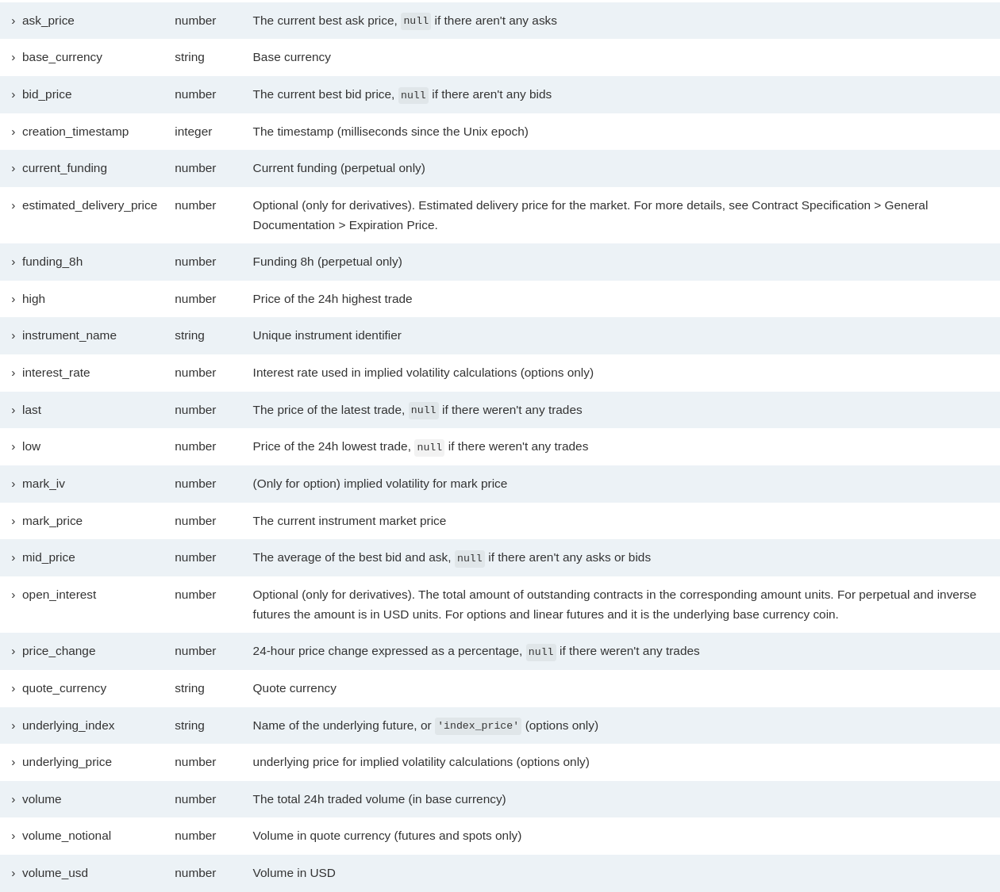

In [52]:
underlying_price = data.loc[0, 'underlying_price']
creation_time = data.loc[0, 'creation_timestamp']

In [53]:
#drop undesired columns
to_drop = [\
    'high', 'low', 'last', 'open_interest', 'price_change',\
    'underlying_price', 'underlying_index', \
    'estimated_delivery_price', 'quote_currency', 'volume_usd', 'mid_price',\
    'base_currency', 'bid_price', 'ask_price', 'interest_rate']
data.drop(to_drop, inplace = True, axis = 1)

In [54]:
#converting prices into USD
data['mark_price'] = data['mark_price']*underlying_price
data['volume'] = data['volume']*underlying_price

In [55]:
#Now we need to convert instrument_name into Strike and Maturity columns

def find_all(s, c):
    # find all char(c) in str(s)
    idx = s.find(c)
    while idx != -1:
        yield idx
        idx = s.find(c, idx + 1)

name = data['instrument_name']
maturity = list()
strike = list()

for item in name:
    tmp = list(find_all(item, '-'))
    strike.append(float(item[tmp[-2]+1:tmp[-1]]))
    maturity.append(item[tmp[0]+1:tmp[-2]]+ '8') #+8 because expiration occurs at 8am UTC+0

data['Strike'] = strike
data['Maturity'] = maturity
data.drop('instrument_name', axis = 1, inplace = True)

In [56]:
mod = lambda s: time.mktime(datetime.datetime.strptime(s, "%d%b%y%H").timetuple()) + 3*60*60 #+3*60*60 cause mktime generate timestamp in system timezone(UTC+3 for me)
data['Maturity'] = (data['Maturity'].apply(mod)-creation_time/1000)/60/60/24/365
data.drop('creation_timestamp', axis = 1, inplace = True)

In [57]:
data

,mark_price,volume,mark_iv,Strike,Maturity
0,7288.102804,0.000000e+00,88.14,76000.0,0.002530
1,6315.489722,0.000000e+00,87.38,77000.0,0.002530
2,5362.565733,8.326254e+03,86.09,78000.0,0.002530
3,4391.641216,0.000000e+00,77.46,79000.0,0.002530
4,3493.059359,8.351233e+06,75.24,80000.0,0.002530
...,...,...,...,...,...
722,8.126424,0.000000e+00,37.04,250000.0,0.797051
723,8.116433,0.000000e+00,38.26,260000.0,0.797051
724,0.401325,0.000000e+00,32.46,270000.0,0.797051
725,0.000000,0.000000e+00,0.00,280000.0,0.797051


Although zero volume seems sus, in the educational purposes we'll proceed.
In the final df prices are in USD, time in days.
Also it is reasonable to delete rows with zero IV.

In [58]:
data = data.drop(np.where(data['volume'] == 0 )[0])
data = data.reset_index()
data

,index,mark_price,volume,mark_iv,Strike,Maturity
0,2,5362.565733,8.326254e+03,86.09,78000.0,0.002530
1,4,3493.059359,8.351233e+06,75.24,80000.0,0.002530
2,6,2685.565059,1.973322e+06,75.24,81000.0,0.002530
3,7,2319.470480,1.182328e+06,75.24,81500.0,0.002530
4,8,1950.489189,5.578590e+05,73.31,82000.0,0.002530
...,...,...,...,...,...,...
202,542,13165.337631,3.330502e+04,86.89,95000.0,0.298421
203,557,2718.404639,4.163127e+07,58.41,120000.0,0.298421
204,585,51295.804014,2.081564e+05,150.94,46000.0,0.547736
205,674,12854.257945,2.081564e+06,27.54,78000.0,0.797051


In [59]:
T = np.array(data['Maturity'])
K = np.array(data['Strike'])
V = np.array(data['mark_price'])
fig = go.Figure(data = [go.Scatter3d(x = T, y = K, z = V,\
                mode = 'markers',\
                marker = {'size': 3})])
fig.update_layout(width = 700, height = 700)
fig.show()

### Fitting

https://www.researchgate.net/publication/318151322_Calibration_and_simulation_of_Heston_model

The parameters of Heston model are $\kappa, \bar{v}, \gamma, \rho, v_0$.

In [46]:
T = (np.unique(data['Maturity']))[4]
index = np.where(data['Maturity'] == T)[0]

mrkt_price = np.array(data['mark_price'][index])
strikes = np.array(data['Strike'][index])

Time to maturity =  0.029595170915776976
underlying price =  83104.0039581038


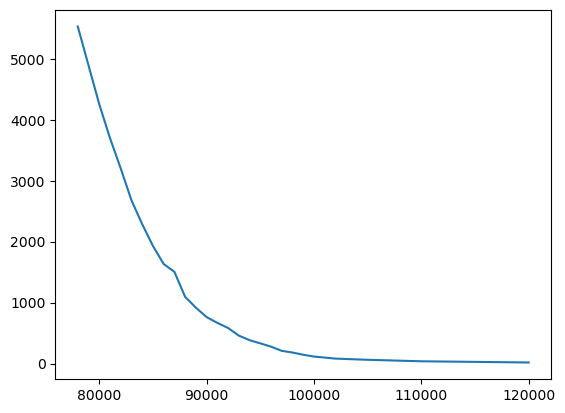

In [47]:
print('Time to maturity = ', T)
print('underlying price = ', underlying_price)
plt.plot(strikes, mrkt_price)

In [48]:
def bsm_call_price(S, T, K, sigma, r):
    d1 = (np.log(S/K) + (r + 0.5*sigma**2)*T)/sigma/np.sqrt(T)
    d2 = d1 - sigma*np.sqrt(T)
    return S*sp.stats.norm.cdf(d1) - K*np.exp(-r*T)*sp.stats.norm.cdf(d2)

bsm_call_price_for_iv = lambda S, T, K, r : lambda sigma: bsm_call_price(S, T, K, sigma, r)

iv_calc = lambda S, T, K, r, mrkt_price : sp.optimize.root_scalar(lambda x : bsm_call_price_for_iv(S,T, K, r)(x) - mrkt_price, method='newton', x0 = 1).root

In [49]:
np.unique(strikes)

array([ 78000.,  80000.,  81000.,  82000.,  83000.,  84000.,  85000.,
        86000.,  87000.,  88000.,  89000.,  90000.,  91000.,  92000.,
        93000.,  94000.,  95000.,  96000.,  97000.,  98000.,  99000.,
       100000., 101000., 102000., 103000., 105000., 110000., 120000.])

In [50]:
st = 90000
idx = np.where(strikes == st)[0]
res = sp.optimize.root_scalar(lambda x : bsm_call_price_for_iv(underlying_price,T, st, r)(x) - mrkt_price[idx], method='newton', x0 = 1)
print('iv = ', res.root)
print('market price = ', mrkt_price[idx])
print('iv price = ', bsm_call_price_for_iv(underlying_price, T, st, r)(res.root))


iv =  [0.50986714]
market price =  [762.86566993]
iv price =  [762.86566993]


In [51]:
iv_array = np.zeros_like(strikes)

for i in range(iv_array.size):
    iv_array[i] = iv_calc(underlying_price, T, strikes[i], r, mrkt_price[i])

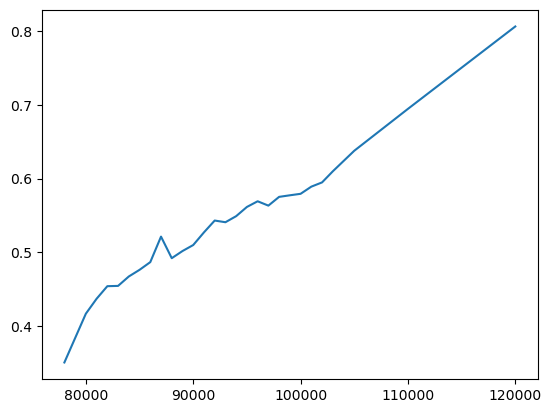

In [52]:
plt.plot(strikes, iv_array)

When the implied volatilities are plotted against the strike price at a fixed maturity, one often observes a
skew or smile pattern, which has been shown to be directly related to the conditional non-normality of the
underlying return risk-neutral distribution. In particular, a smile reflects fat tails in the return distribution
whereas a skew indicates return distribution asymmetry

In [28]:
##optional1

S = 100


v0 = 0.0175
r = 0.03
rho = -0.5711
kappa = 1.5768
mean = 0.0398
gamma = 0.5751

NK = 20
NT = 20
K_mesh, T_mesh = np.meshgrid(np.linspace(70, 140, NK), np.linspace(0.1, 3, NT))

underlying_price = S

T = T_mesh.flatten()
strikes = K_mesh.flatten()

mrkt_price = np.zeros_like(T)

for i, item in enumerate(mrkt_price):
    mrkt_price[i] = calc_vanilla_price_cos(kappa, mean, gamma, rho, v0, T[i], underlying_price, r, strikes[i], a, b, N)
    mrkt_price[i] = mrkt_price[i]*(1 + sp.stats.norm.rvs(size = 1, loc = 0, scale = 0.05))


In [53]:
##optional2

T = np.array(data['Maturity'])

mrkt_price = np.array(data['mark_price'])
strikes = np.array(data['Strike'])

In [54]:
#funciton for heston call price that will be used in optimization
# what to do with v0
N = 1000
a = -10
b = 10
r = 0.03

def func(args):
    kappa, mean, gamma, rho, v0 = args
    res = np.zeros_like(mrkt_price)
    for i, item in enumerate(mrkt_price):
        res[i] = (item - calc_vanilla_price_cos(kappa, mean, gamma, rho, v0, T[i], underlying_price, r, strikes[i], a, b, N))**2
    return np.sum(res)
    

In [55]:
from scipy.optimize import least_squares

In [56]:
%%time

#x0 = [1.57, 0.0398, 0.5751 , -0.5711, 0.0175]
#x0 = [2, 0.01, 0.1 , 0.5711, 0.03]
x0 = [8.18347824, 0.15705266, 0.51803595, 0.62478752, 0.50210429]
res = least_squares(func, x0, bounds = ([0, 0, 0, -1, 0], [np.inf,np.inf, np.inf, 1, np.inf]), max_nfev = 1000)

CPU times: user 5min 50s, sys: 49.8 ms, total: 5min 50s
Wall time: 5min 51s


In [57]:
res.x

array([ 1.29911102,  0.08927785,  2.01577117, -0.24337822,  0.36916351])

In [58]:
NK = 30
NT = 30
K_mesh, T_mesh = np.meshgrid(np.linspace(np.min(strikes), np.max(strikes), NK), np.linspace(np.min(T), np.max(T), NT))

Z_calibrated = np.vectorize(calc_vanilla_price_cos)(*res.x, T_mesh, underlying_price, r, K_mesh, a, b, N)

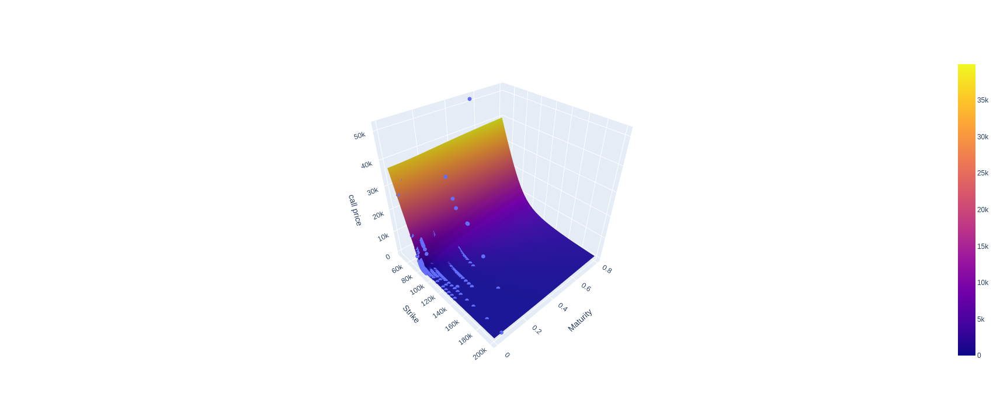

In [59]:
fig = go.Figure(data = [
    go.Scatter3d(x = strikes, y = T, z = mrkt_price,\
                                     mode = 'markers', marker = dict(size = 4)), 
    go.Surface(x = K_mesh, y = T_mesh, z = Z_calibrated)
])

fig.update_layout(
    height = 700, width = 700,
    scene = dict(zaxis_title = 'call price', xaxis_title = 'Strike', yaxis_title = 'Maturity')
)

In [ ]:
plt.scatter(strikes, mrkt_price,s = 3, c= 'red', label = 'market')
plt.plot(strikes, Z_calibrated, label = 'scipy calibrated')
plt.legend()

In [ ]:
iv_array_hest = np.zeros_like(strikes)

for i in range(iv_array_hest.size):
    iv_array_hest[i] = iv_calc(underlying_price, T, strikes[i], r, Z_calibrated[i])

In [ ]:
plt.scatter(strikes, iv_array,s = 3, c = 'red', label = 'market')
plt.plot(strikes, iv_array_hest, label = 'calibrated')

## Hedging

For the Heston model with correlated EMM BM we have:

$dV = (\frac{\partial V}{\partial t} + rS\frac{\partial V}{\partial S} + \kappa(\bar{v} - v)\frac{\partial V}{\partial v} + \frac{1}{2}vS^2\frac{\partial^2 V}{\partial S^2} + \rho \gamma S v\frac{\partial^2 V}{\partial S \partial v} + \frac{1}{2}\gamma^2 s \frac{\partial^2 V}{\partial v^2})dt + S\sqrt{v}\frac{\partial V}{\partial S}dW_{S} + \gamma \sqrt{v}\frac{\partial V}{\partial v}dW_{v}$


So, let's construct portfolio consisting of the options $V_{0}, V_{1}$ on the same underlying with the same time to expiration but with different strikes.

So, let's say we want to sell a call option. How do we hedge our risks?

$V(T, S)$ - theoretical price of a call option with $T - \;$ time to maturity and $S - \;$ current asset price.

**Delta hedge:**

We sell an option and buy $\delta_s(0)$ amount of stock. Then:

$\Pi(0) = V(T, S_0) - \delta_s(0) S_0$ - Initial value of a portfolio.

$PnL(t) = \Pi(t) - V(T-t, S)$

At time $t$ values of a portfolio is $\Pi(t) = -V(T-t, S) - \delta_s(t) S(t) + \Pi(0)$

We take  $\delta_s = \frac{\partial V}{\partial S}$

**Delta-Sigma hedge:**

Now we sell an option, buy $\delta_s(0)$ amount of stock, and buy $\delta_{V_1}$ amount of another call option with $(K_1, T_1)$ on the same underlying.
Then:

$\Pi(0) = V(T, S_0) - \delta_s(0) S_0 - \delta_{V_1}(0)V_1(T_1, S, K_1)$ - Initial value of a portfolio.

Where: $\delta_{V_1} = \frac{\partial V}{\partial v} / \frac{\partial V_1}{\partial v}$ 

$\delta_{s} = \frac{\partial V}{\partial S} - \delta_{V_1}\frac{\partial V_1}{\partial S}$ 

In [123]:
S = 110
T = 2
K = 100.0
r = 0.03

heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.0575
)

N_paths = 5000
N_steps = 365*2
t = np.linspace(0, T, N_steps)
update_cir_qe_paths(heston_params, T, N_paths, N_steps)
update_logprice_vals(heston_params, T, S, r, N_paths, N_steps)


# in order to simplify implementation we can choose rebalancing time interval devisible by T/(N_steps-1)
dt = T/(N_steps-1)

In [124]:
a = -5.0
b = 5.0
N = 300

In [125]:
%%time
#N*((T-t) > 0.05) + 5000*(1 - (T-t) > 0.05)
N_ = N
price_paths = np.exp(out_logprice_val.copy_to_host())
option_price_paths_0 = calc_vanilla_price_cos(*heston_params.to_array(), T - t, price_paths, r, K, a, b, N_, True)
print('**********')
option_delta_paths_0 = calc_vanilla_delta_cos(*heston_params.to_array(), T - t, price_paths, r, K, a, b, N_, True)
option_delta_paths_0 = np.where(option_delta_paths_0 > 1.0, 1.0, option_delta_paths_0)
option_delta_paths_0 = np.where(option_delta_paths_0 < 0.0, 0.0, option_delta_paths_0)
print('**********')
option_gamma_paths_0 = calc_vanilla_gamma_cos(*heston_params.to_array(), T - t, price_paths, r, K, a, b, N_, True)
option_gamma_paths_0[:, -1] = option_gamma_paths_0[:, -2]
print('**********')
option_vega_paths_0 = calc_vanilla_vega_cos(*heston_params.to_array(), T - t, price_paths, r, K, a, b, N_, True)

**********
**********
**********
CPU times: user 48min 53s, sys: 8.63 s, total: 49min 2s
Wall time: 7min 10s


In [126]:
%%time
#We also need another two options H1 and H2
K1 = 130
T1 = 3
N_ = N
option_price_paths_1 = calc_vanilla_price_cos(*heston_params.to_array(), T1 - t, price_paths, r, K1, a, b, N_, True)
print('**********')
option_delta_paths_1 = calc_vanilla_delta_cos(*heston_params.to_array(), T1 - t, price_paths, r, K1, a, b, N_, True)
option_delta_paths_1 = np.where(option_delta_paths_1 > 1.0, 1.0, option_delta_paths_1)
option_delta_paths_1 = np.where(option_delta_paths_1 < 0.0, 0.0, option_delta_paths_1)
print('**********')
option_gamma_paths_1 = calc_vanilla_gamma_cos(*heston_params.to_array(), T1 - t, price_paths, r, K1, a, b, N_, True)
option_gamma_paths_1[:, -1] = option_gamma_paths_1[:, -2]
print('**********')
option_vega_paths_1 = calc_vanilla_vega_cos(*heston_params.to_array(), T1 - t, price_paths, r, K1, a, b, N_, True)

**********
**********
**********
CPU times: user 49min 13s, sys: 8.69 s, total: 49min 21s
Wall time: 7min 7s


In [127]:
%%time
K2 = 120
T2 = 4
N_ = N
option_price_paths_2 = calc_vanilla_price_cos(*heston_params.to_array(), T2 - t, price_paths, r, K2, a, b, N_, True)
print('**********')
option_delta_paths_2 = calc_vanilla_delta_cos(*heston_params.to_array(), T2 - t, price_paths, r, K2, a, b, N_, True)
print('**********')
option_gamma_paths_2 = calc_vanilla_gamma_cos(*heston_params.to_array(), T2 - t, price_paths, r, K2, a, b, N_, True)
option_gamma_paths_2[:, -1] = option_gamma_paths_2[:, -2]
print('**********')
option_vega_paths_2 = calc_vanilla_vega_cos(*heston_params.to_array(), T2 - t, price_paths, r, K2, a, b, N_, True)

**********
**********
**********
CPU times: user 49min 15s, sys: 6.82 s, total: 49min 22s
Wall time: 7min


In [ ]:
for i in range(10):
    fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (25, 6))
    axs[0].set_title('option price')
    axs[1].set_title('delta')
    axs[2].set_title('gamma')
    axs[3].set_title('vega')
    axs[0].plot(t, option_price_paths_2[i, :])
    axs[1].plot(t, option_delta_paths_2[i, :])
    axs[1].plot([t[0], t[-1]], [1, 1])
    axs[1].plot([t[0], t[-1]], [0, 0])
    axs[2].plot(t, option_gamma_paths_2[i, :])
    axs[3].plot(t, option_vega_paths_2[i, :])
    plt.show()

In [128]:
#Delta
def delta_hedge(k):
    m = int(T//(k*dt))
    rebalance_times = np.linspace(0, m*k*dt, m+1)
    pnl = np.zeros((N_paths, m+1+1))
    pnl[:, 0] = option_price_paths_0[:, 0] - option_delta_paths_0[:, 0]*price_paths[:, 0]
    for i in range(1, m+1):
        pnl[:, i] = pnl[:, i-1]*np.exp(r*k*dt) - (option_delta_paths_0[:, i*k] - option_delta_paths_0[:, k*(i-1)])*price_paths[:, k*i]
    pnl[:, m+1] = pnl[:, m]*np.exp(r*(T-rebalance_times[-1])) - option_price_paths_0[:, -1] + option_delta_paths_0[:, i*k]*price_paths[:, -1]
    return pnl, pnl[:, -1].mean(), pnl[:, -1].var()

def delta_sigma_hedge(k):
    m = int(T//(k*dt))
    rebalance_times = np.linspace(0, m*k*dt, m+1) #include everything but the last point T
    pnl = np.zeros((N_paths, m+1+1))
    tmp2 = option_vega_paths_0/option_vega_paths_1
    tmp1 = option_delta_paths_0 - tmp2*option_delta_paths_1
    pnl[:, 0] = option_price_paths_0[:, 0] - tmp1[:, 0]*price_paths[:, 0] - tmp2[:, 0]*option_price_paths_1[:, 0]

    for i in range(1, m+1):
        pnl[:, i] = pnl[:, i-1]*np.exp(r*k*dt) - (tmp1[:, k*i] - tmp1[:, k*(i-1)])*price_paths[:, k*i] - (tmp2[:, k*i] - tmp2[:, k*(i-1)])*option_price_paths_1[:, k*i]
    pnl[:, m+1] = pnl[:, m]*np.exp(r*(T - rebalance_times[-1])) - option_price_paths_0[:, -1] + tmp1[:, k*i]*price_paths[:, -1] + \
    tmp2[:, k*i]*option_price_paths_1[:, -1]
    return pnl, pnl[:, -1].mean(), pnl[:, -1].var()

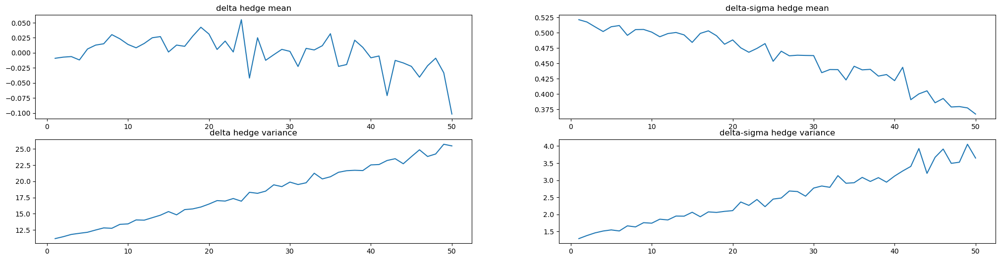

In [129]:
fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (25, 6))
tmp = {0:'delta hedge', 1:'delta-sigma hedge'}
for i, method in enumerate([delta_hedge, delta_sigma_hedge]):
    axs[0, i].set_title(tmp[i] + ' mean')
    axs[1, i].set_title(tmp[i] + ' variance')
    k_max = 50
    mean = np.zeros(k_max)
    var = np.zeros(k_max)
    for k in range(1, k_max+1):
        _, mean[k-1], var[k-1] = method(k)
    axs[0, i].plot(np.arange(1, k_max+1), mean)
    axs[1, i].plot(np.arange(1, k_max+1), var)

In [ ]:
def delta_sigma_gamma_hedge(k):
    m = int(T//(k*dt))
    rebalance_times = np.linspace(0, m*k*dt, m+1) #include everything but the last point T
    pnl = np.zeros((N_paths, m+1+1))
    tmp2 = (option_vega_paths_2*option_gamma_paths_0 - option_vega_paths_0*option_gamma_paths_2)/(option_vega_paths_2*option_gamma_paths_1 - option_vega_paths_1*option_gamma_paths_2)
    tmp3 = (option_gamma_paths_0 - tmp2*option_gamma_paths_1)/option_gamma_paths_2
    tmp1 = option_delta_paths_0 - tmp2*option_delta_paths_1 - tmp3*option_delta_paths_2
    pnl[:, 0] = option_price_paths_0[:, 0] - tmp1[:, 0]*price_paths[:, 0] - tmp2[:, 0]*option_price_paths_1[:, 0] - tmp3[:, 0]*option_price_paths_2[:, 0]

    for i in range(1, m+1):
        pnl[:, i] = pnl[:, i-1]*np.exp(r*k*dt) - (tmp1[:, k*i] - tmp1[:, k*(i-1)])*price_paths[:, k*i] - (tmp2[:, k*i] - tmp2[:, k*(i-1)])*option_price_paths_1[:, k*i]  - (tmp3[:, k*i] - tmp3[:, k*(i-1)])*option_price_paths_2[:, k*i]
    pnl[:, m+1] = pnl[:, m]*np.exp(r*(T - rebalance_times[-1])) - option_price_paths_0[:, -1] + tmp1[:, k*i]*price_paths[:, -1] + \
    tmp2[:, k*i]*option_price_paths_1[:, -1] + tmp3[:, k*i]*option_price_paths_2[:, -1]
    return pnl, pnl[:, -1].mean(), pnl[:, -1].var()

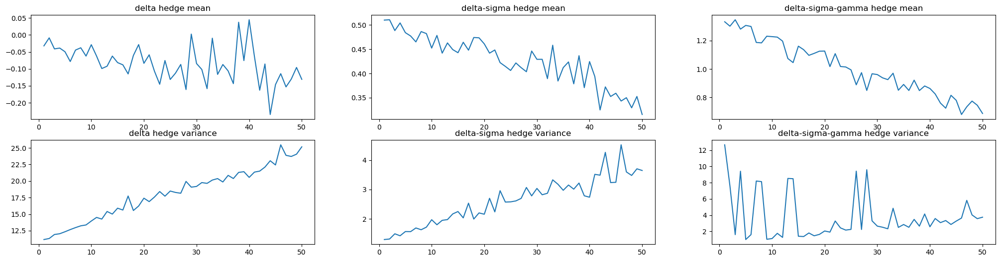

In [98]:
fig, axs = plt.subplots(nrows = 2, ncols = 3, figsize = (25, 6))
tmp = {0:'delta hedge', 1:'delta-sigma hedge', 2: 'delta-sigma-gamma hedge'}
for i, method in enumerate([delta_hedge, delta_sigma_hedge, delta_sigma_gamma_hedge]):
    axs[0, i].set_title(tmp[i] + ' mean')
    axs[1, i].set_title(tmp[i] + ' variance')
    k_max = 50
    mean = np.zeros(k_max)
    var = np.zeros(k_max)
    for k in range(1, k_max+1):
        _, mean[k-1], var[k-1] = method(k)
    axs[0, i].plot(np.arange(1, k_max+1), mean)
    axs[1, i].plot(np.arange(1, k_max+1), var)

0.5175447598452317 1.379663211376256


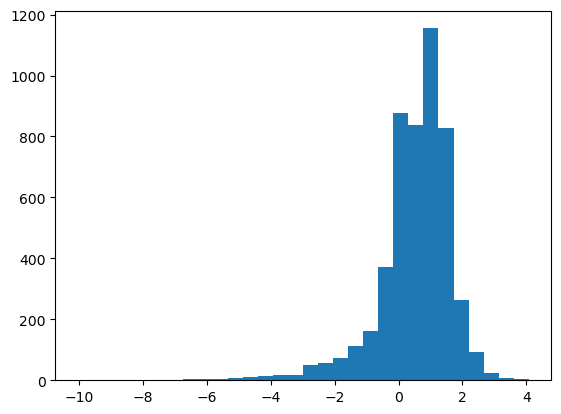

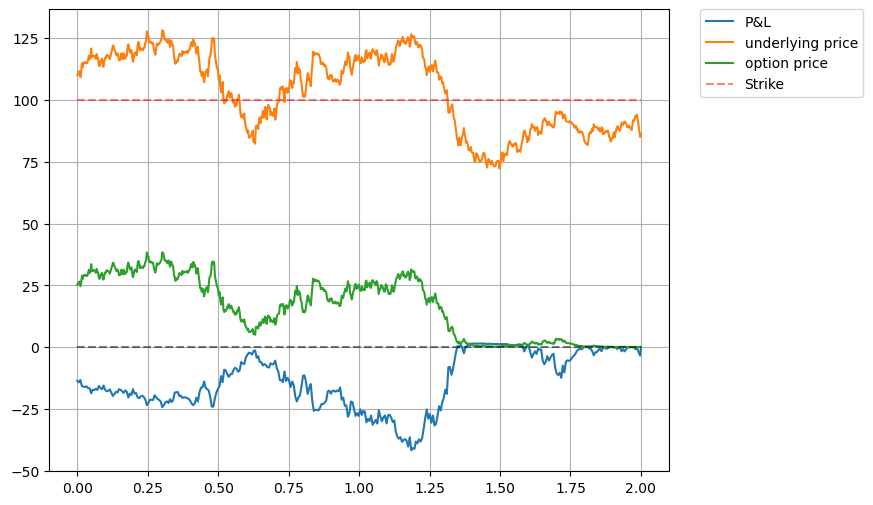

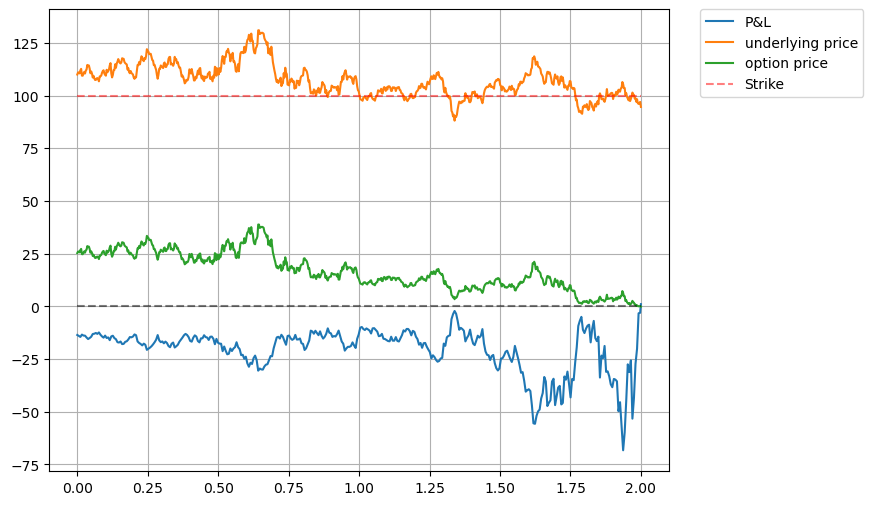

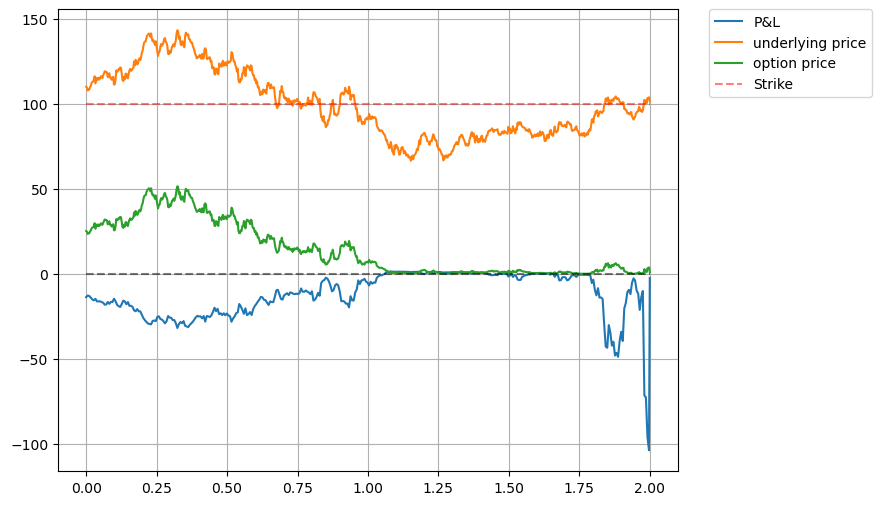

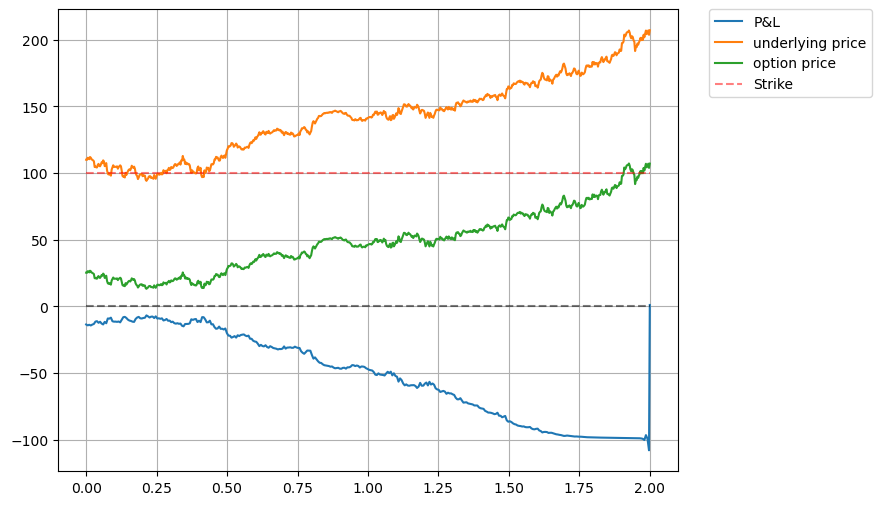

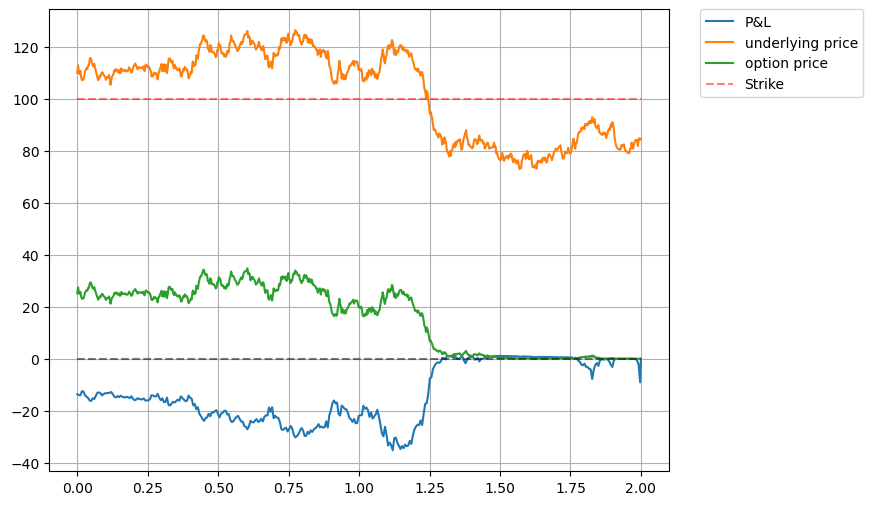

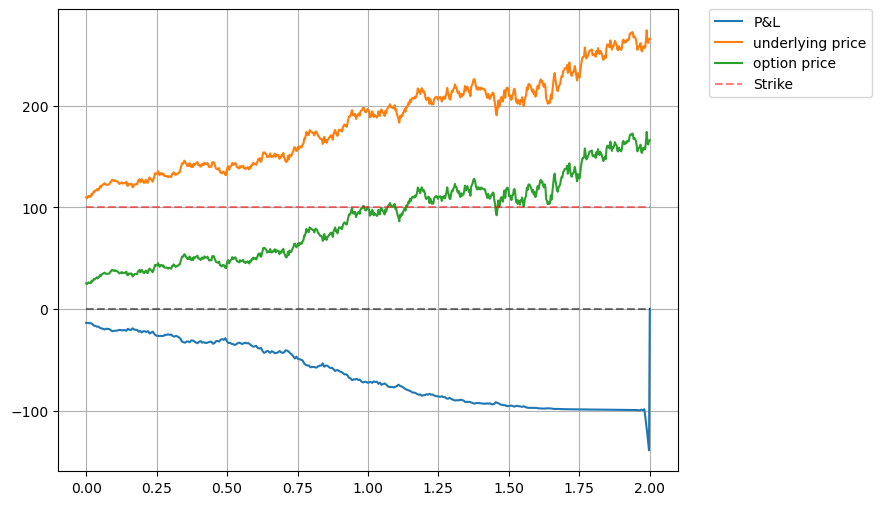

In [130]:
k = 2
m = int(T//(k*dt))
rebalance_times = np.linspace(0, m*k*dt, m+1)
time = np.concatenate((rebalance_times, np.array(T).reshape(1, )))

pnl, mean, var = delta_sigma_hedge(k)
plt.hist(pnl[:, -1], bins = 30)
print(mean, var)
plt.show()
for i in range(6):
    plt.figure(figsize = (8, 6))
    plt.plot(time, pnl[i, :], label = "P&L")
    plt.plot(t, price_paths[i, :], label = 'underlying price')
    plt.plot(t, option_price_paths_0[i, :], label = 'option price')
    plt.plot([t[0], t[-1]], [K, K], label = 'Strike', c = 'red', alpha = 0.5, ls = '--')
    plt.plot([t[0], t[-1]], [0.0, 0.0], c = 'black', alpha = 0.5, ls = '--')
    plt.grid()
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    plt.show()

# American option pricing

The value of an american option is the value achieved by exercising optimally.

Formulation of the problem in dynamic-programming sense:

$V_m(x) = h(x)$

$V_i(x) = max\{h(x), C_i(x)\}$

$i = 0,..., m-1$

We are interested in $V_0(X_0)$

$C_{i}(s) = \mathbb{E}_Q \left[V_{i+1}(S_{i+1})|S_{i}= s\right ] $

In regression based models we are approximating continuation value by linear combination of basis functions:


$C_{i}(s) = \mathbb{E}_Q \left[V_{i+1}(S_{i+1})|S_{i}= s\right ] = \sum\limits_{r = 1}^M\beta_{ir} \psi_r(s)$

$S_{i} - \text{underlying price at} \; i_{th} \; \text{step}$ 

$V_{i} - \text{option value at} \; i_{th} \; \text{step}$

$\psi_r(s) - \text{basis functions}$

Then: $C_i(S_i)\psi^T = \beta_i\psi\psi^T \Rightarrow \psi C_i(S_i) = \psi \psi^T \beta$

$\mathbb{E}\left[\psi(S_i)C_i(S_i)\right] =  \mathbb{E}\left[\mathbb{E} \psi(S_i)\left[V_{i+1}(S_{i+1})|S_{i}= s\right ]\right] = \mathbb{E} \left[ \psi(S_i)V_{i+1}(S_{i+1})\right]$

$\beta_i = \mathbb{E} \left[ \psi(S_i)\psi^T(S_i)\right]^{-1}\mathbb{E} \left[ \psi(S_i)V_{i+1}(S_{i+1})\right]$

Let's say, that we want to approzimate continuation value:

$y_i = \sum_\limits{k=0}^d \sum_\limits{m=0}^d w_{km} \phi_k(x_{1i}) \phi_m(x_{2i})$

In [160]:
S = 40
T = 1.5
K = 40
r = 0.06


heston_params = HestonParams(
    kappa = 1.5768, 
    mean = 0.0898,
    gamma = 0.3551,
    rho = -0.5711,
    v0 = 0.04
)

N_paths = 100000
N_steps = 200
dt = T/(N_steps - 1)
discount = np.exp(-dt*r)
update_cir_qe_paths(heston_params.to_array(), T, N_paths, N_steps)
update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)

asset_prices = np.exp(out_logprice_val)
volatility = np.sqrt(out_cir)
payoff = lambda s: np.maximum(0, s-K)
option_values = np.zeros((N_paths, N_steps))
option_values[:, -1] = payoff(asset_prices[:, -1])

In [161]:
@njit
def chebyshev(x, d):
    
    n = x.size
    result = np.zeros((n, d + 1))
    
    # T_0(x) = 1
    result[:, 0] = 1.0
    
    if d == 0:
        return result
    
    # T_1(x) = x
    result[:, 1] = x
    
    if d == 1:
        return result
    
    # Recurrence relation: T_n(x) = 2x * T_{n-1}(x) - T_{n-2}(x)
    for i in range(2, d + 1):
        result[:, i] = 2 * x * result[:, i - 1] - result[:, i - 2]
    
    return result

@njit
def A_matrix(x1, x2, d1, d2):
    basis_1 = chebyshev(x1, d1)
    basis_2 = chebyshev(x2, d2)

    design_matrix = np.zeros((x1.size, (d1+1)*(d2+1)))
    for i in range(x1.size):
        design_matrix[i, :] = np.outer(basis_1[i, :], basis_2[i, :]).flatten()
        
    return design_matrix

In [101]:
X1 = asset_prices[:, -2]
X2 = volatility[:, -2]

X1_scaled = 2*(X1 - X1.min())/(X1.max() - X1.min()) - 1 
X2_scaled = 2*(X2 - X2.min())/(X2.max() - X2.min()) - 1 
V = discount*payoff(asset_prices[:, -1])

idx = np.where(payoff(X1) > 0.0)[0]

In [102]:
d1 = 3
d2 = 4
A = A_matrix(X1_scaled, X2_scaled, d1, d2)

coef = np.linalg.lstsq(A[idx], V[idx])[0]
V_hat = np.matmul(A, coef)

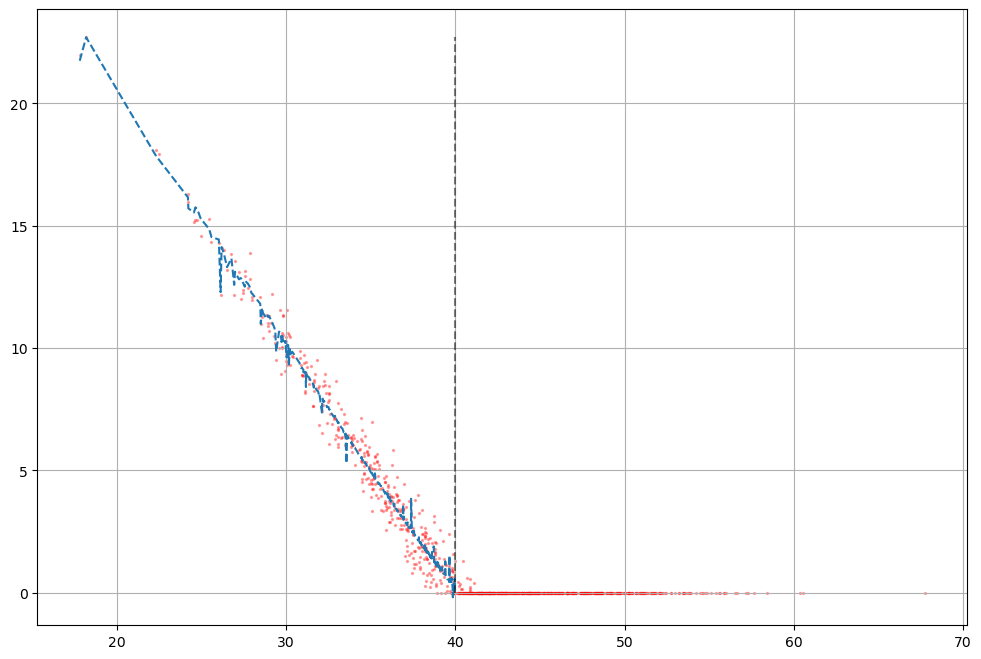

In [103]:
plt.figure(figsize = (12, 8))
plt.scatter(X1, V, c = 'red', s = 2, alpha = 0.3)
plt.plot(X1[idx][np.argsort(X1[idx])], V_hat[idx][np.argsort(X1[idx])], ls = '--')
plt.plot([K, K], [0, np.max(V)], alpha = 0.5, c = 'black', ls = '--')
plt.grid()

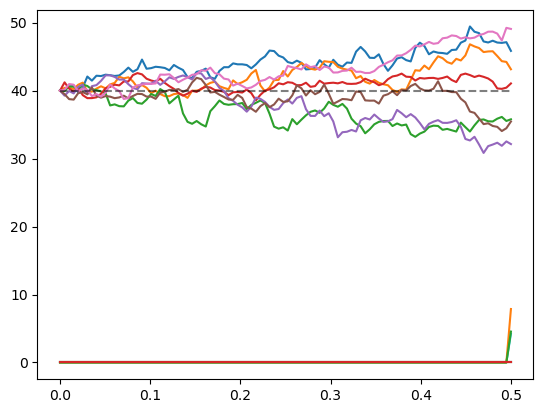

In [104]:
t = np.linspace(0, T, N_steps)
idx_2 = np.where(np.abs(asset_prices[:, -1] - K) < 10)[0][:7]
plt.plot(t, asset_prices[idx_2, :].T)
plt.plot(t, option_values[idx_2, :].T)
plt.plot([0, T], [K, K], ls = '--', color = 'black', alpha = 0.5)
plt.show()

0.0
-2.1246716486215975


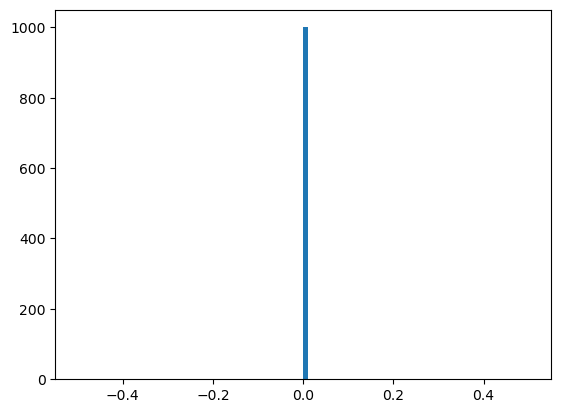

In [105]:
print(np.mean(option_values[:,1]))
print(np.mean(option_values[:,1]) - calc_vanilla_price_mc(T, r, K, N_paths, N_steps, call = False))
plt.hist(option_values[:,1], bins = 100)
plt.show()

In [162]:
american_values = list()
european_values = list()
S_list = np.linspace(K*0.5, K*1.5, 25)
for S in S_list:
    print(S)
    update_logprice_vals(heston_params.to_array(), T, S, r, N_paths, N_steps)
    asset_prices = np.exp(out_logprice_val)
    option_values = np.zeros((N_paths, N_steps))
    option_values[:, -1] = payoff(asset_prices[:, -1])


    for j in range(N_steps-2, 0, -1):
        X1, X2, V = asset_prices[:, j], volatility[:, j], discount*option_values[:, j+1]
        idx = np.where(V > 0)[0]
        X1_scaled = 2*(X1 - X1.min())/(X1.max() - X1.min()) - 1 
        X2_scaled = 2*(X2 - X2.min())/(X2.max() - X2.min()) - 1
    
        d1 = 2
        d2 = 0
        A = A_matrix(X1_scaled, X2_scaled, d1, d2)
        coef = np.linalg.lstsq(A[idx], V[idx])[0]
        
        cont = np.matmul(A, coef)
        option_values[:, j] = np.where(payoff(X1) >= cont + 1e-6, payoff(X1), cont)
    
        '''
        #idx_2 = np.where(np.abs(asset_prices[:, -1] - K) < 10)[0][:5]
        #print('deg = ', deg)
        print('timestep =  ', j)
        #print(X[idx_2].round(4),  '<- asset price') #asset price at -2
        #print(payoff(X[idx_2]).round(4),  '<-immediate payoff:' )#payoff at -2
        #print(cont[idx_2].round(4), '<-immediate continuation value: ' )
        #print(option_values[idx_2, j].round(4), '<-estimated value: ' ) #value at -2
        #print('*********************************')
        plt.figure(figsize = (12, 8))
        plt.scatter(X1, V, c = 'red', s = 5, alpha = 0.3)
        plt.plot(X1[idx][np.argsort(X1[idx])], cont[idx][np.argsort(X1[idx])], ls = '--')
        plt.plot([K, K], [0, np.max(V)], alpha = 0.5, c = 'black', ls = '--')
        plt.ylim((-10, 100))
        plt.grid()
        plt.show()
        '''
    american_values.append(np.mean(option_values[:,1]))
    #european_values.append(calc_vanilla_price_mc(T, r, K, N_paths, N_steps, call = False))
    european_values.append(calc_vanilla_price_cos(*heston_params.to_array(), T, S, r, K, a, b, N, True))

20.0
21.666666666666668
23.333333333333332
25.0
26.666666666666668
28.333333333333336
30.0
31.666666666666668
33.333333333333336
35.0
36.66666666666667
38.333333333333336
40.0
41.66666666666667
43.333333333333336
45.0
46.66666666666667
48.333333333333336
50.0
51.66666666666667
53.333333333333336
55.0
56.66666666666667
58.333333333333336
60.0


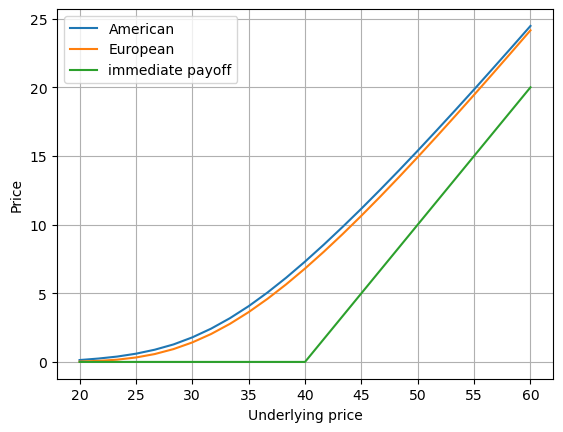

In [163]:
plt.plot(S_list, american_values, label = 'American')
plt.plot(S_list, european_values, label = 'European')
plt.plot(S_list, payoff(S_list), label = 'immediate payoff')
plt.xlabel('Underlying price')
plt.ylabel('Price')
plt.grid()
plt.legend()

# IR models

Here are just some basics of IR modeling.

$R(t, T) = -\frac{\ln P(t, T)}{T-t} \Rightarrow P(t, T) = e^{-R(t, T)(T-t)}$, where $R(t, T) - \text{ZCYC}$, 
$P(t, T) - \text{ZCB};$

To make $R(t, T) $ and $P(t, T)$ - continuous and differentiable we interpolate them with cubic splines.

$f(0, T) = \frac{\partial R(0, T)}{\partial T}T + R(0, T)$ - forward rate

In [38]:
#Deepseek realization of scipy.interpolate.CubicSpline using JAX
#Produce almost the same result as scipy
def create_cubic_spline_interpolator(x_data, y_data, bc_type='not-a-knot'):
    x_data = jnp.asarray(x_data)
    y_data = jnp.asarray(y_data)
    n = x_data.shape[0]
    h = x_data[1:] - x_data[:-1]
    delta = (y_data[1:] - y_data[:-1]) / h

    # Build tridiagonal system for not-a-knot boundary conditions
    if bc_type == 'not-a-knot':
        A = jnp.zeros((n, n))
        rhs = jnp.zeros(n)
        A = A.at[0, 0].set(h[1])
        A = A.at[0, 1].set(-(h[0] + h[1]))
        A = A.at[0, 2].set(h[0])
        A = A.at[-1, -3].set(h[-2])
        A = A.at[-1, -2].set(-(h[-2] + h[-1]))
        A = A.at[-1, -1].set(h[-1])
        for i in range(1, n-1):
            A = A.at[i, i-1].set(h[i-1])
            A = A.at[i, i].set(2*(h[i-1] + h[i]))
            A = A.at[i, i+1].set(h[i])
            rhs = rhs.at[i].set(6*(delta[i] - delta[i-1]))
    else:  # Natural
        A = jnp.zeros((n-2, n-2))
        rhs = jnp.zeros(n-2)
        for i in range(n-2):
            if i > 0:
                A = A.at[i, i-1].set(h[i])
            A = A.at[i, i].set(2*(h[i] + h[i+1]))
            if i < n-3:
                A = A.at[i, i+1].set(h[i+1])
            rhs = rhs.at[i].set(6*(delta[i+1] - delta[i]))
        mu_inner = jnp.linalg.solve(A, rhs)
        mu = jnp.concatenate([jnp.zeros(1), mu_inner, jnp.zeros(1)])

    # Solve for mu (second derivatives)
    mu = jnp.linalg.solve(A, rhs) if bc_type == 'not-a-knot' else mu

    # Compute coefficients (same as before)
    a = y_data[:-1]
    b = delta - h*(2*mu[:-1] + mu[1:])/6
    c = mu[:-1]/2
    d = (mu[1:] - mu[:-1])/(6*h)

    @jax.jit
    def interpolate(x):
        idx = jnp.clip(jnp.searchsorted(x_data, x) - 1, 0, n-2)
        dx = x - x_data[idx]
        return a[idx] + dx*(b[idx] + dx*(c[idx] + dx*d[idx]))

    return interpolate

<Figure size 1200x800 with 0 Axes>

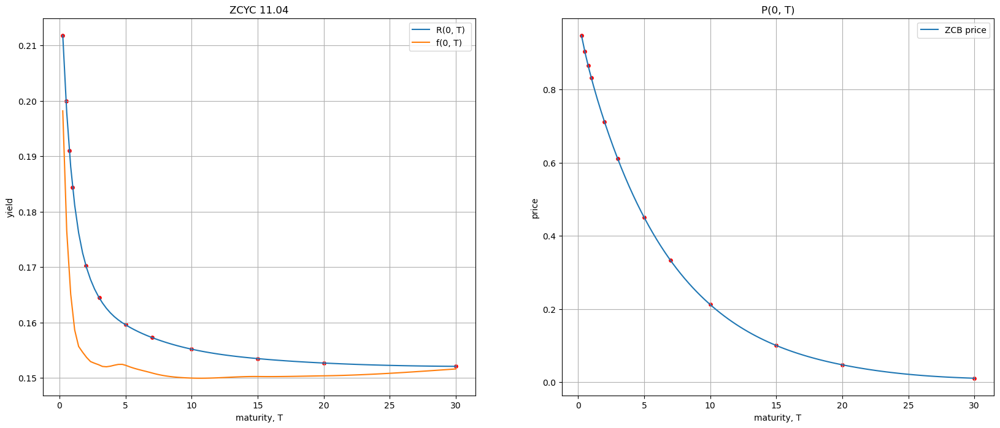

In [39]:
#Data from MOEX ZCYC
maturities = jnp.array([0.25, 0.5, 0.75, 1, 2, 3, 5, 7, 10, 15, 20, 30])
yields = jnp.array([21.18, 19.99, 19.1, 18.44, 17.03, 16.45, 15.96, 15.73, 15.52, 15.35, 15.27, 15.21]) / 100

#Interpolating using cubic splines; Derivatives declaration
R_spline = create_cubic_spline_interpolator(maturities, yields)
R_spline_der = jax.grad(R_spline)
R_spline_2der = jax.grad(jax.grad(R_spline))
P_spline = create_cubic_spline_interpolator(maturities, jnp.exp(-yields*maturities))
min_maturities, max_maturities = jnp.min(maturities), jnp.max(maturities)
x = jnp.linspace(min_maturities, max_maturities, 100)

#Plotting
plt.figure(figsize = (12, 8))
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 8))
axs[0].plot(x, R_spline(x), label = 'R(0, T) ')
axs[0].plot(x, jax.vmap(R_spline_der)(x)*x + R_spline(x), label = 'f(0, T)')
axs[0].scatter(maturities, yields, s = 15, c = 'red')
axs[0].set_xlabel('maturity, T')
axs[0].set_ylabel('yield')
axs[0].set_title('ZCYC 11.04')

axs[1].plot(x, P_spline(x), label = 'ZCB price')
axs[1].scatter(maturities, jnp.exp(-yields*maturities), s = 15, c = 'red')
axs[1].set_xlabel('maturity, T')
axs[1].set_ylabel('price')
axs[1].set_title('P(0, T)')

for ax in axs:
    ax.grid()
    ax.legend()

Next, to model short rate we use Hull-White model:

$dr(t) = \lambda(\theta(t) - r(t))dt + \eta dW(t)$ - model specification under EMM;

In this model we can calibrate $\theta(t)$ to market data using market prices of ZCB:

$\theta(t) = f(0, t) + \frac{1}{\lambda}\frac{\partial f(0, t)}{\partial t} + \frac{\eta^2}{2 \lambda^2}(1 - e^{-2\lambda t})$, where $f(0, t)$ can be found from ZCYC from above.


To calibrate $\eta$ we need to use market data for IR swaptions/Caps/Floors, that is out of the scope of this notebook.
Calibration of $\lambda$ is optional. 

So, standard values for  $\eta, \lambda$ will be taken.

In [40]:
#Euler discretization for HW model
@jax.jit
def HW_next_step(lambda_, eta, r_prev, theta_prev, dt, z):
    r_next = r_prev + lambda_*(theta_prev - r_prev)*dt + eta*dt*z
    return r_next

#f(0, T)
@jax.jit
def init_forward(T):
    return jax.vmap(R_spline_der)(T)*T + R_spline(T)

#df(0, T)/dT
@jax.jit
def init_forward_der(T):
    return jax.vmap(R_spline_2der)(T)*T + 2*jax.vmap(R_spline_der)(T)

#\theta(t)
@jax.jit
def theta(T, lambda_, eta):
    return 1/lambda_*init_forward_der(T) + init_forward(T) + eta**2/2/lambda_**2*(1 - jnp.exp(-2*lambda_*T))

#Creating HW paths
def get_HW_paths(lambda_, eta, r0, T, N_paths, N_steps, key):
    dt = T/(N_steps-1)

    def step(carry, key):
        t_prev, r_prev = carry
        
        key1 = jax.random.split(key, 1)
        z = jax.random.normal(key, (N_paths, ))

        theta_prev = theta(t_prev + dt, lambda_, eta)
        r_next = HW_next_step(lambda_, eta, r_prev, theta_prev, dt, z)
        t_next = t_prev + dt
        return (t_next, r_next), r_next

    keys = jax.random.split(key, (N_steps-1, ))
    r_init = jnp.full(N_paths, r0)
    t_init = jnp.full(N_paths, 0.0)
    _, r = jax.lax.scan(step, (t_init, r_init), keys)

    return jnp.vstack((r_init, r)).T

get_HW_paths = jax.jit(get_HW_paths, static_argnums=(4, 5))

In [42]:
%%time
N_paths = 200000
N_steps = 500
lambda_ = 0.1
eta = 0.01
r0 = R_spline(0.0)
T = 30
key = jax.random.key(37)

r = get_HW_paths(lambda_, eta, r0, T, N_paths, N_steps, key)

CPU times: user 695 ms, sys: 524 ms, total: 1.22 s
Wall time: 1.22 s


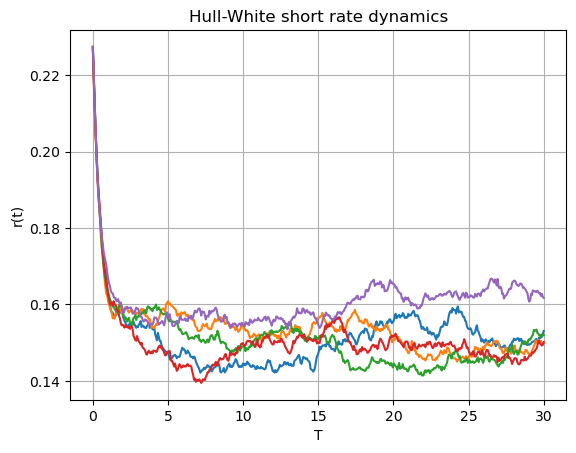

In [43]:
t = jnp.linspace(0, T, N_steps)
plt.plot(t, r[:5, :].T)
plt.title('Hull-White short rate dynamics')
plt.xlabel('T')
plt.ylabel('r(t)')
plt.grid()
plt.show()

Given short-rate paths we can estimate ZCB prices. They should be equal to those that are implied by ZCYC.

$P(0, T) = \mathbb{E}_Q\left[e^{-\int_0^T r(s)ds} |\mathcal{F}_0\right]
\approx \frac{1}{N_{paths}}\sum\limits_{i = 1}^{N_{paths}}e^{-\int_0^T r_i(s)ds}$

In [44]:
@jax.jit
def compute_int(r, t):
    return jax.scipy.integrate.trapezoid(r, t)

#vectorized computation of integrals
integrals = jax.vmap(compute_int, in_axes=(0, None))

zcb_prices = jnp.zeros_like(maturities)

for i, T in enumerate(maturities):
    r = get_HW_paths(lambda_, eta, r0, T, N_paths, N_steps, key)
    t = jnp.linspace(0, T, N_steps)
    tmp = integrals(r, t)
    
    zcb_prices = zcb_prices.at[i].set(jnp.mean(jnp.exp(-tmp)))

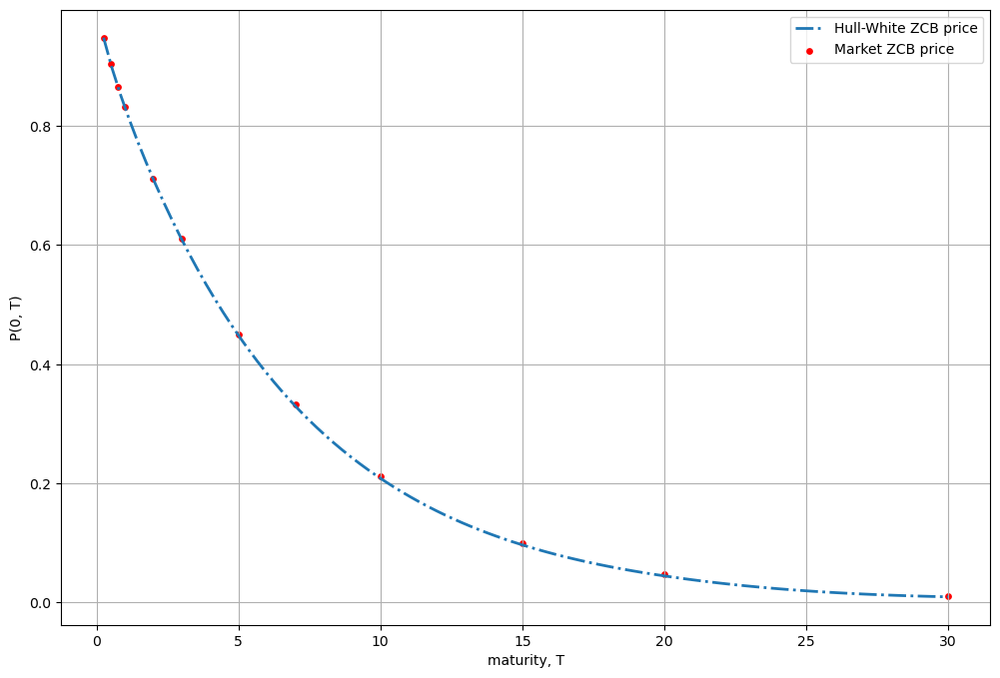

In [45]:
P_hw_spline = create_cubic_spline_interpolator(maturities, zcb_prices)


plt.figure(figsize = (12, 8))
plt.plot(x, P_hw_spline(x), label = 'Hull-White ZCB price', lw = 2, ls = '-.')
plt.scatter(maturities, jnp.exp(-yields*maturities), s = 15, c = 'red', label = 'Market ZCB price')
plt.xlabel('maturity, T')
plt.ylabel('P(0, T)')
plt.grid()
plt.legend()

One can observe that calibrated Hull-White model correctly reproduce ZCB prices and thus can be used to price IR derivatives.

# Time-Series inference

The goal of this section is to train time-series predictive model using RNN.

The model will predict the next value in the sequence based on $L$ previous observations.

The dataset contains hourly energy consumption.

In [53]:
from sklearn.preprocessing import StandardScaler
import copy

In [38]:
import kagglehub

In [39]:
path = kagglehub.dataset_download("robikscube/hourly-energy-consumption")

In [49]:
AEP = pd.read_csv(path + '/AEP_hourly.csv')
AEP = AEP.rename(columns = {'AEP_MW' : 'MW'})
AEP

,Datetime,MW
0,2004-12-31 01:00:00,13478.0
1,2004-12-31 02:00:00,12865.0
2,2004-12-31 03:00:00,12577.0
3,2004-12-31 04:00:00,12517.0
4,2004-12-31 05:00:00,12670.0
...,...,...
121268,2018-01-01 20:00:00,21089.0
121269,2018-01-01 21:00:00,20999.0
121270,2018-01-01 22:00:00,20820.0
121271,2018-01-01 23:00:00,20415.0


The dataset contains multiple entries for the same date (duplicates), each with different energy consumption values. To create a clean, single-value-per-day time series, we aggregate duplicates by taking the mean consumption per date.

Also we change data format to UNIX timestamp, to be able to use it as a predictor.

In [50]:
unique, count = np.unique(AEP['Datetime'].values, return_counts=True)

print(np.unique(count, return_counts=True)) ##There is 4 dates that are presented twice into data

print('repeated dates:',  unique[np.where(count == 2)]) #Repeated dates


#Substitute duplicates with mean
for item in unique[np.where(count == 2)[0]]:
    idx = np.where(AEP['Datetime'] == item)[0]
    mw_mean = np.mean(AEP.iloc[idx, 1])
    AEP.iloc[idx[0], 1] = mw_mean
    AEP = AEP.drop(idx[1])
    AEP.reset_index(drop = True, inplace=True)

(array([1, 2]), array([121265,      4]))
repeated dates: ['2014-11-02 02:00:00' '2015-11-01 02:00:00' '2016-11-06 02:00:00'
 '2017-11-05 02:00:00']


In [51]:
#unix time creation and datasort
AEP['unix_time'] = pd.to_datetime(AEP['Datetime'])
AEP['unix_time'] = AEP['unix_time'].apply(lambda s: int(s.timestamp()))

AEP = AEP.sort_values('unix_time')
AEP = AEP.reset_index(drop = True)

AEP

,Datetime,MW,unix_time
0,2004-10-01 01:00:00,12379.0,1096592400
1,2004-10-01 02:00:00,11935.0,1096596000
2,2004-10-01 03:00:00,11692.0,1096599600
3,2004-10-01 04:00:00,11597.0,1096603200
4,2004-10-01 05:00:00,11681.0,1096606800
...,...,...,...
121264,2018-08-02 20:00:00,17673.0,1533240000
121265,2018-08-02 21:00:00,17303.0,1533243600
121266,2018-08-02 22:00:00,17001.0,1533247200
121267,2018-08-02 23:00:00,15964.0,1533250800


Eventually that is how the dataset looks like.

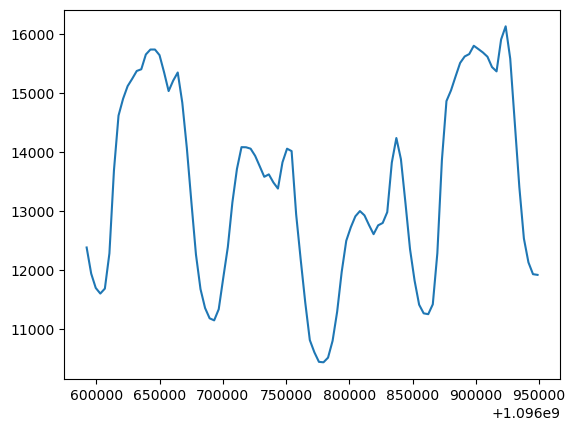

In [52]:
#data plotting
plt.plot(AEP['unix_time'].values[:100], AEP['MW'].values[:100])

To ensure a realistic evaluation of a model, the test set should be constructed as large, continuous segments of the timeline—unseen during training—to evaluate the model’s ability to generalize.

In [141]:
def create_dataloaders(x_data, y_data, L, batch_size, train_size = 0.8):
    test_size  = 1 - train_size

    num = x_data.size - L #Total number of possible sequences
    x_tmp = np.zeros((num, L))
    y_tmp = np.zeros((num, L))
    target_tmp = np.zeros(num)
    for i in range(num):
        x_tmp[i, :] = x_data[i:i+L]
        y_tmp[i, :] = y_data[i:i+L]
        target_tmp[i] = y_data[i+L]

    #Scaling the data
    x_scaler = StandardScaler().fit(x_tmp)
    y_scaler = StandardScaler().fit(y_tmp)
    target_scaler = StandardScaler().fit(target_tmp.reshape(-1, 1))

    x_tmp = x_scaler.transform(x_tmp, copy = True)
    y_tmp = y_scaler.transform(y_tmp, copy = True)
    target_tmp = target_scaler.transform(target_tmp.reshape(-1, 1), copy = True)

    x_tmp = torch.tensor(x_tmp , dtype = torch.float32)
    y_tmp = torch.tensor(y_tmp , dtype = torch.float32)


    X = torch.stack((x_tmp, y_tmp), dim = 2)
    Y = torch.tensor(target_tmp, dtype = torch.float32)
    
    #Creating appropriate test set;
    index = np.arange(num)
    sub_seq = 10*L 
    test_index = np.arange(0, num - sub_seq, num//100) 
    for item in test_index:
        test_index = np.concatenate((test_index, np.arange(item+1, item+1+sub_seq, 1)))

    train_index = np.delete(index, test_index)
    X_train, Y_train = X[train_index], Y[train_index]
    X_test, Y_test = X[test_index], Y[test_index]

    
    train_dataset = TensorDataset(X_train, Y_train)
    test_dataset = TensorDataset(X_test, Y_test)
    train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
    test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False)



    return x_scaler, y_scaler , target_scaler, train_dataloader, test_dataloader

In [199]:
L = 17 #L - window lenght
batch_size = 400

x = copy.deepcopy(AEP['unix_time'].values)
y = copy.deepcopy(AEP['MW'].values)

x_scaler, y_scaler, target_scaler,  train_dataloader,  test_dataloader = create_dataloaders(x, y, L, batch_size)

The model: 3 stacked RNN, with hidden_size = 25 and dropout regularization;

In [200]:
X_tmp, Y_tmp = next(iter(train_dataloader))

input_size = X_tmp.shape[-1]
hidden_size = 25
num_layers = 3

class myRNN(nn.Module):
    
    def __init__(self, hidden_size = hidden_size, input_size=input_size, output_size=1):
        super().__init__()
        self.rnn = nn.RNN(input_size = input_size, hidden_size = hidden_size, num_layers = num_layers,
             nonlinearity = 'tanh', bias = True, batch_first = True, dropout = 0.2)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x, h = None):
        output , _ = self.rnn(x, h)
        out = self.fc(output[:, -1, :])
        return out

In [201]:
learning_rate = 0.01
epochs = 50

model = myRNN()
device = 'cuda'
model.to(device)

loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [202]:
def train_loop(dataloader, model, loss_fn, optimizer):
    model.train()
    j = 0
    cum_loss = .0
    
    for batch, (X, y) in enumerate(dataloader):
        X = X.to(device)
        y = y.to(device)
        pred = model(X).to(device)
        loss = loss_fn(pred, y).to(device)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        
        
        
        if batch % 50 == 0:
            j+=1
            loss, current = loss.item(), batch * batch_size + len(X)
            cum_loss += loss
            print(f"batch {batch} loss: {loss:.5}")
            
    print(f'mean train loss : {cum_loss/j:.5}', )            
    return cum_loss/j

def test_loop(dataloader, model, loss_fn):
    model.eval()
    size = len(dataloader)
    loss = .0

    with torch.no_grad():
        for (X, y) in dataloader:
            X = X.to(device)
            y = y.to(device)
            pred = model(X).to(device)
            loss += loss_fn(pred, y).to(device)


        
    print(f'test loss: {loss/size:.5}')
    return float(loss/size)

In [203]:
train_losses = list()
test_losses = list()
for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train_losses.append(train_loop(train_dataloader, model, loss_fn, optimizer))
    test_losses.append(test_loop(test_dataloader, model, loss_fn))
print("Done!")

Epoch 1
-------------------------------
batch 0 loss: 1.0491
batch 50 loss: 0.041036
batch 100 loss: 0.030225
batch 150 loss: 0.031672
batch 200 loss: 0.022004
batch 250 loss: 0.031873
mean train loss : 0.20098
test loss: 0.016166
Epoch 2
-------------------------------
batch 0 loss: 0.023981
batch 50 loss: 0.020337
batch 100 loss: 0.017042
batch 150 loss: 0.018811
batch 200 loss: 0.019856
batch 250 loss: 0.017149
mean train loss : 0.019529
test loss: 0.011843
Epoch 3
-------------------------------
batch 0 loss: 0.017372
batch 50 loss: 0.021677
batch 100 loss: 0.017976
batch 150 loss: 0.017053
batch 200 loss: 0.017728
batch 250 loss: 0.015466
mean train loss : 0.017879
test loss: 0.011342
Epoch 4
-------------------------------
batch 0 loss: 0.01841
batch 50 loss: 0.015196
batch 100 loss: 0.016061
batch 150 loss: 0.015532
batch 200 loss: 0.015753
batch 250 loss: 0.014448
mean train loss : 0.0159
test loss: 0.0094187
Epoch 5
-------------------------------
batch 0 loss: 0.014627
batch 

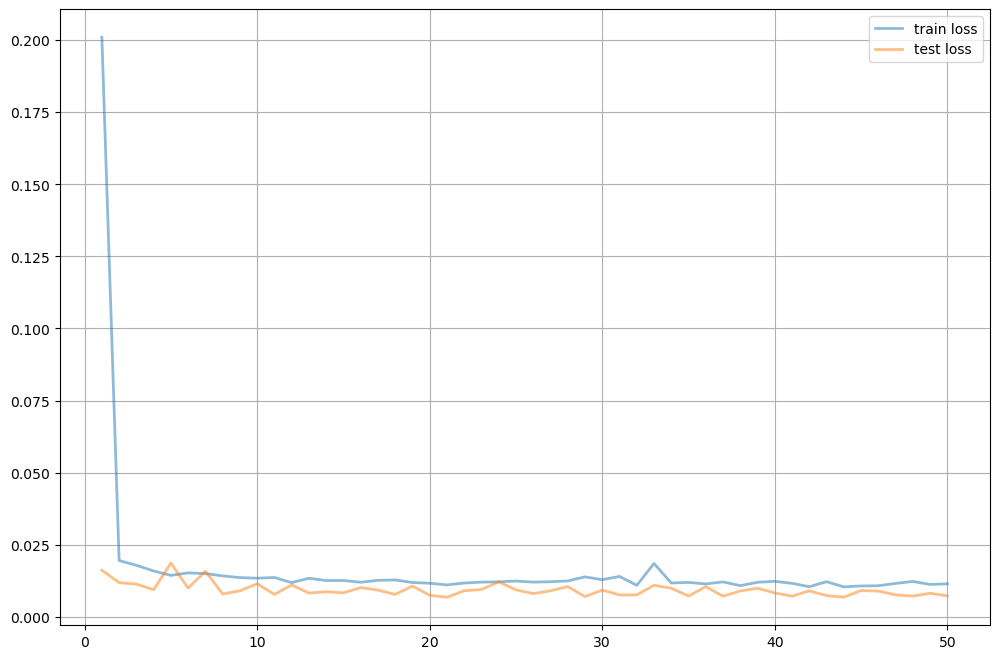

In [204]:
plt.figure(figsize = (12, 8))
plt.plot(np.arange(1, epochs + 1), np.array(train_losses), label = 'train loss', lw = 2, alpha = 0.5)
plt.plot(np.arange(1, epochs + 1), np.array(test_losses), label = 'test loss', lw = 2, alpha = 0.5)
plt.legend()
plt.grid()

To evaluate model we plot its predictions on training sample:

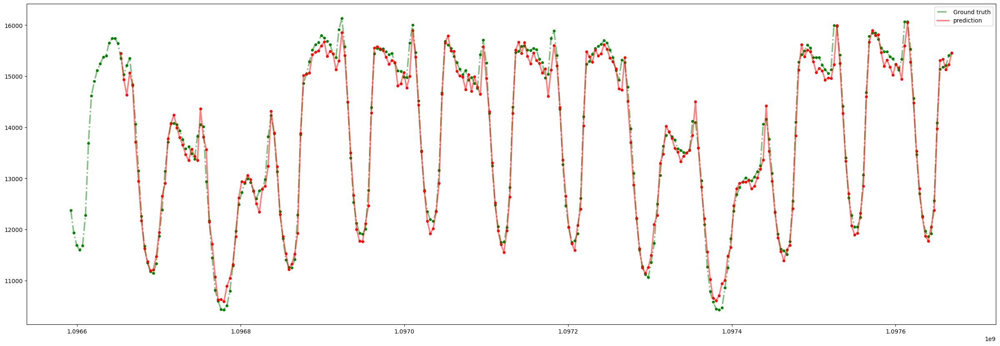

In [205]:
model.to('cpu')

num = 300

y_pred= copy.deepcopy(y)

i = L #index of the time step to be inferred

while i!= num-1:
    x_scaled = x_scaler.transform(x[i-L: i].reshape(1, -1), copy = True)
    y_scaled = y_scaler.transform(y[i-L: i].reshape(1, -1), copy = True)

    x_scaled = torch.tensor(x_scaled, dtype = torch.float32)
    y_scaled = torch.tensor(y_scaled, dtype = torch.float32)

    X = torch.stack((x_scaled, y_scaled), dim = 2)

    y_pred_scaled = np.array(model(X).detach()).reshape(-1, 1)
    y_pred[i] = target_scaler.inverse_transform(y_pred_scaled, copy = True)[0, 0]
    i += 1


plt.figure(figsize = (30, 10))
plt.plot(x[:num], y[:num], c = 'green', ls = '-.', alpha = 0.5, lw = 2.5, label = 'Ground truth')
plt.scatter(x[:num], y[:num], c = 'green',  s = 15)
plt.plot(x[L:num], y_pred[L:num], c = 'red', alpha = 0.5, lw = 2.5, label = 'prediction')
plt.scatter(x[L:num], y_pred[L:num], c = 'red', s = 15)
plt.legend()
plt.show()

Out of sample performance. Here not every sequence is consecutive.

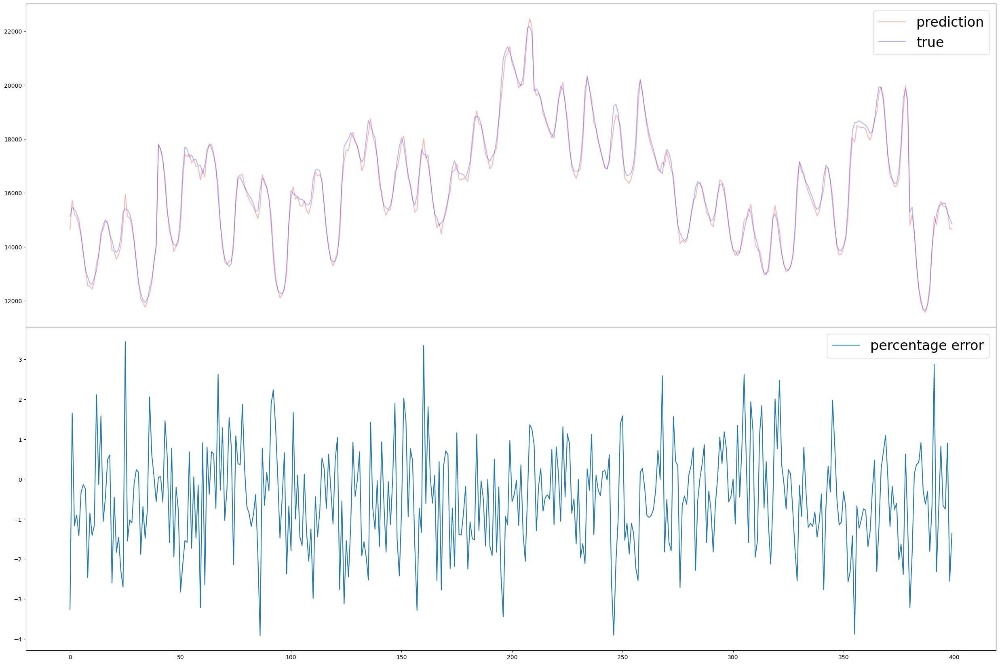

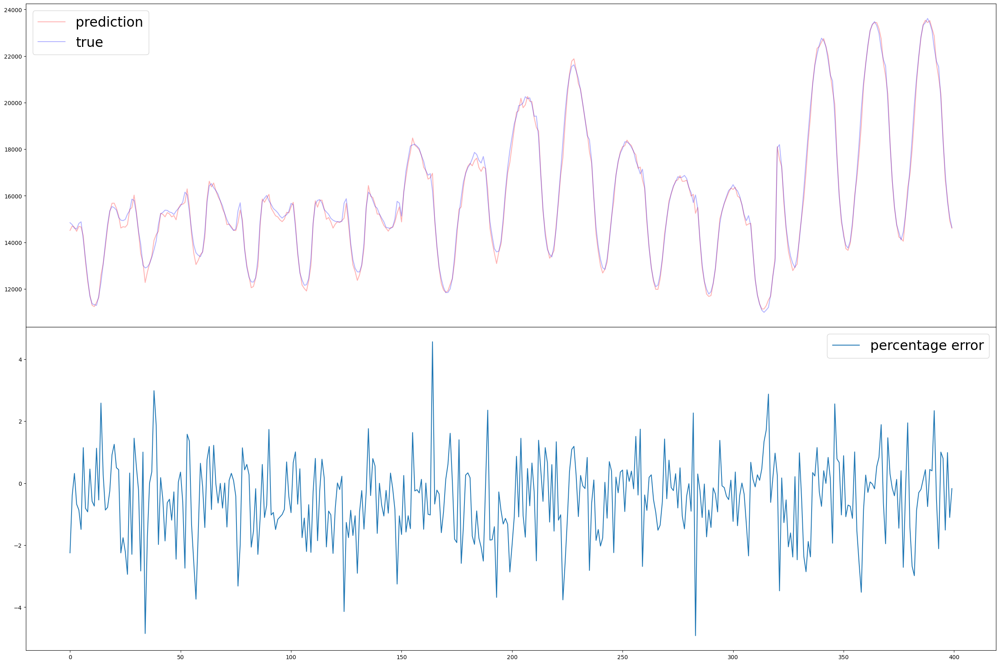

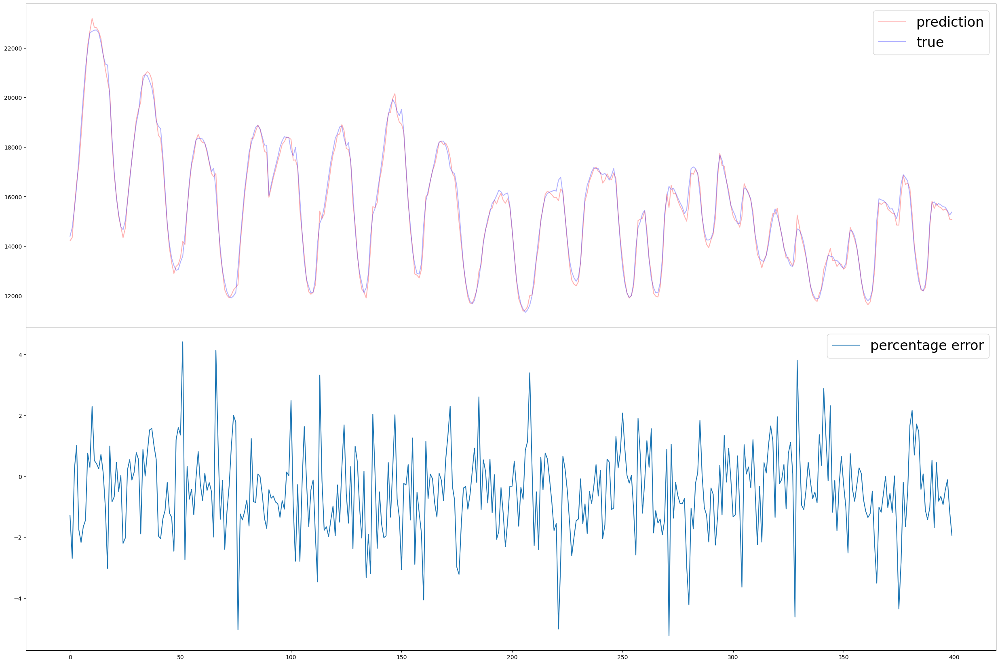

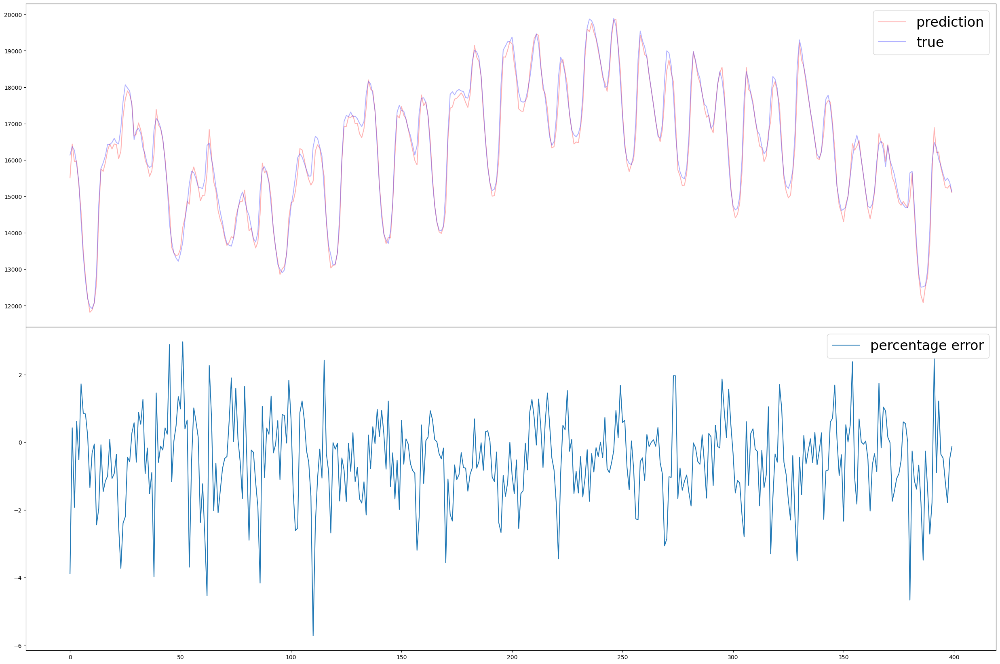

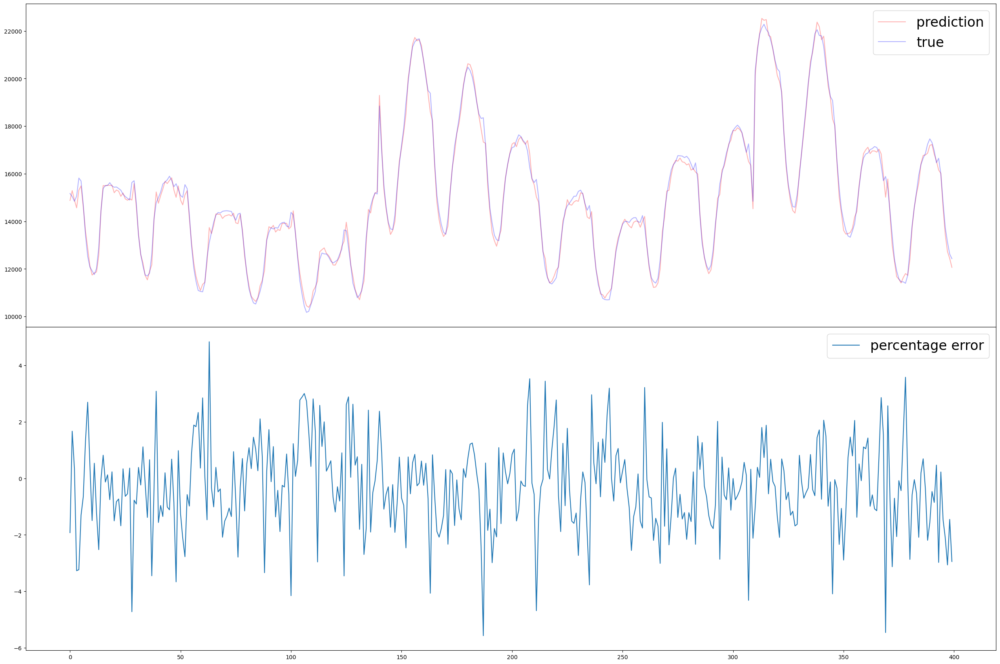

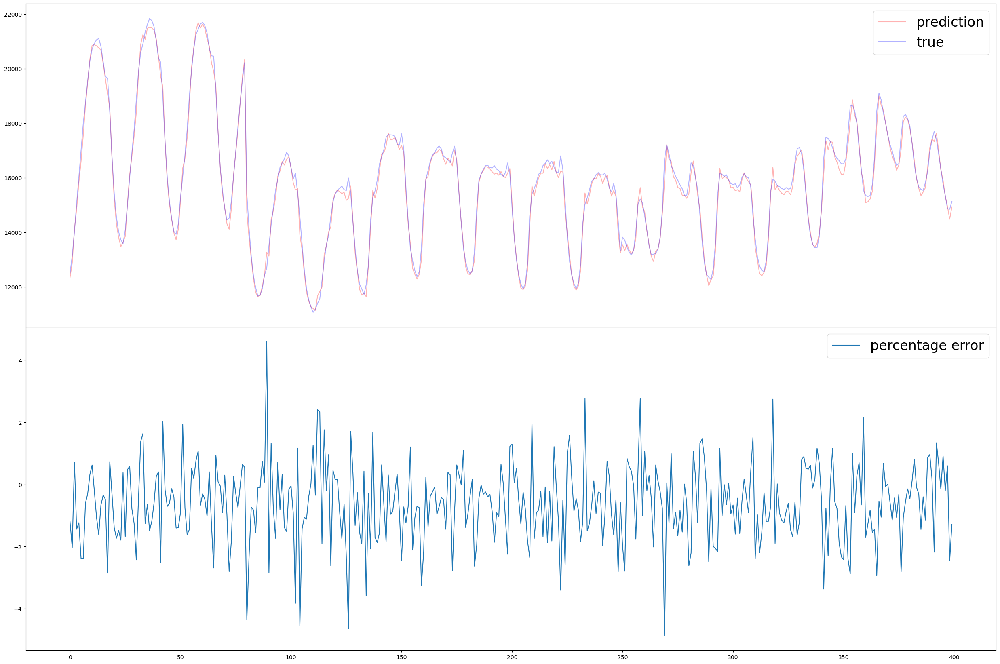

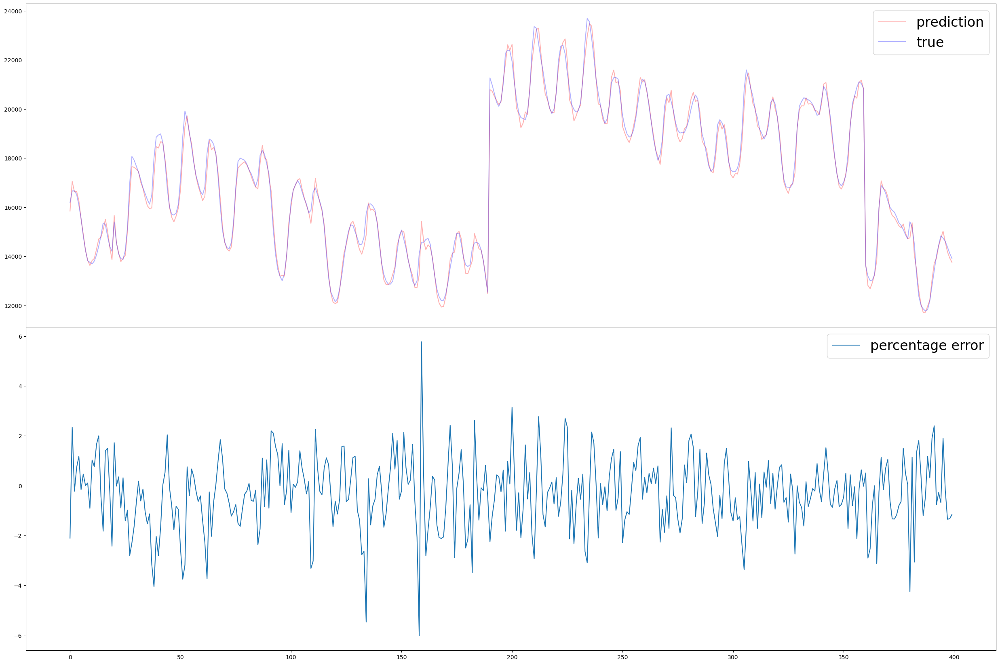

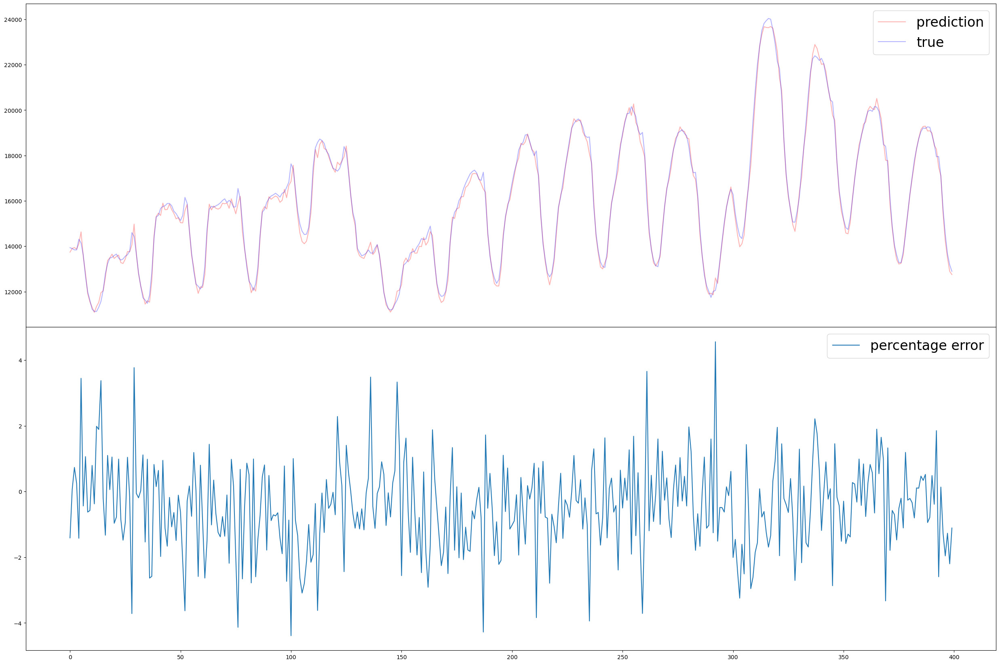

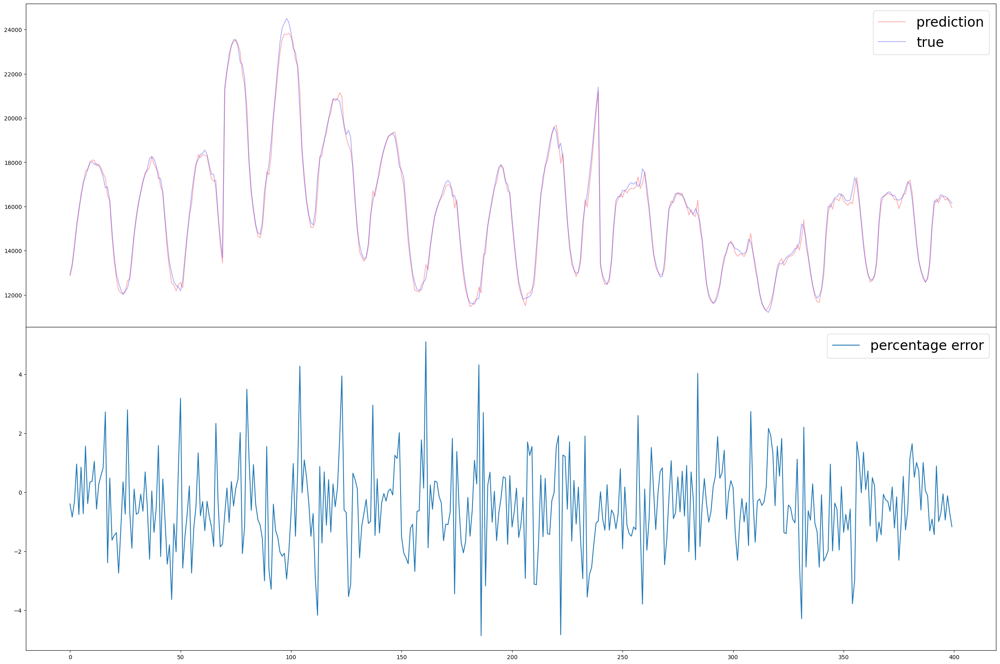

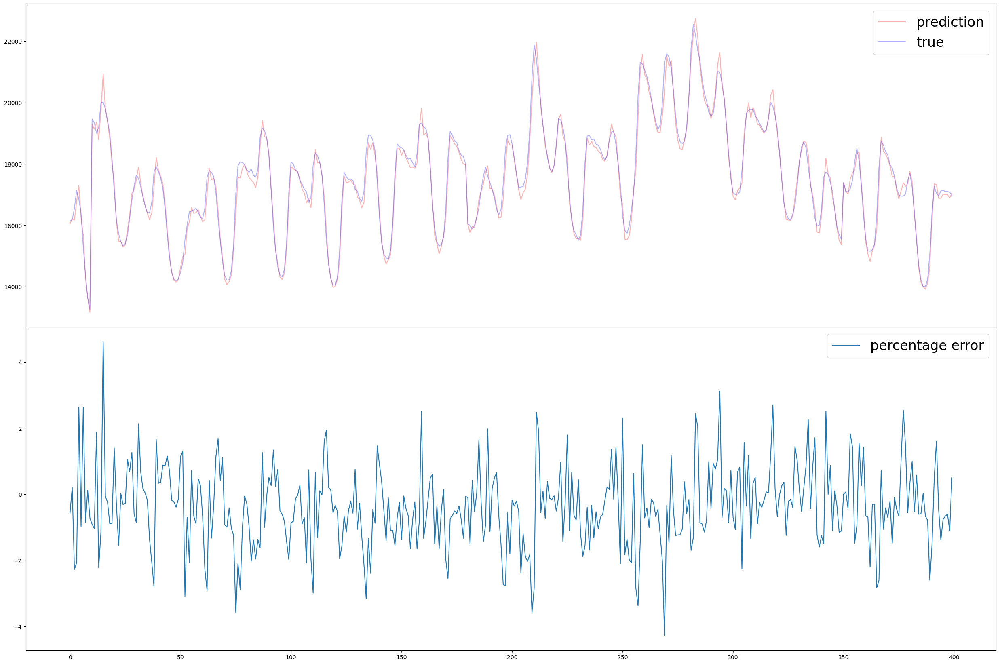

In [206]:
iterable = iter(test_dataloader)
next(iterable)
for _ in range(10):
    X_tmp, Y_tmp = next(iterable)
    X_tmp = X_tmp[:batch_size, :, :]
    Y_tmp = Y_tmp[:batch_size, :]
    y_hat = target_scaler.inverse_transform(model(X_tmp).detach())
    y_true = target_scaler.inverse_transform(Y_tmp.detach())
    fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize = (30, 20), sharex = True)
    plt.subplots_adjust(
    left=0.1,      # Left margin
    right=0.9,     # Right margin
    bottom=0.1,    # Bottom margin
    top=0.9,       # Top margin
    wspace=0.4,    # Horizontal space between subplots
    hspace=0.0001     # Vertical space between subplots
)
    axs[0].plot(y_hat, alpha = 0.3, label = 'prediction', c = 'red')
    axs[0].plot(y_true, c = 'blue', label = 'true', alpha = 0.3 )
    axs[1].plot((y_hat-y_true)/y_true*100, label = 'percentage error' )
    axs[0].legend(fontsize = 24)
    axs[1].legend(fontsize = 24)
    print('\n', '\n')
    plt.show()